In [16]:
%load_ext autoreload
%autoreload 2
import sys
import time
import os

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pprint

import qtrl

from datetime import date
from scipy import signal
from scipy.optimize import curve_fit
from pathlib import Path
from rich import print as rprint
from rich.progress import track
from tqdm import tqdm
from qcodes.instrument_drivers.Keysight.Keysight_N5241B import N5241B
from qtrl.fitting.resonator_fitting import (resonator_regression, reflection_resonator_params, resonator_f_to_S, hanger_resonator_params,)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
try:
    vna = N5241B(name='vna', address='TCPIP::192.168.4.231')
except KeyError as e:
    print(e)

Connected to: Keysight Technologies N5241B (serial:MY58422344, firmware:A.13.60.06) in 0.12s


In [3]:
datadir = Path('data/2024-03-08')

In [4]:
if not os.path.exists(datadir):
    os.makedirs(datadir)

# VNA HELPERS

In [5]:
def trace_to_df(freqs, trace):
    mlog = 20*np.log10(np.abs(trace))
    phase = np.unwrap(np.angle(trace))
    data = pd.DataFrame({'frequency': freqs, 'amplitude': mlog, 'phase': phase, 'I': np.real(trace), 'Q': np.imag(trace)})
    data = data.set_index('frequency')
    return data

def plot_trace(data):
    freqs = data.index.to_numpy()
    fig, axes = plt.subplots(2, 1, sharex=True)
    axes[0].plot(freqs/1e9, data['amplitude'])
    axes[1].plot(freqs/1e9, data['phase'])
    axes[0].set_xlim(freqs[0]/1e9, freqs[-1]/1e9)
    axes[0].set_ylabel('S21 (dB)')
    axes[1].set_ylabel('Phase (rad)')
    axes[1].set_xlabel('Frequency (GHz)')
    
    return fig

def vna_trace(vna, run=True):
    IQ = vna.get_complex_data(run=run)
    N = vna.points()
    freqs = np.linspace(vna.start(), vna.stop(), N)
    data = trace_to_df(freqs, IQ)
    fig = plot_trace(data)
    return fig, data

def vna_trace_no_fig(vna, run=True):
    IQ = vna.get_complex_data(run=run)
    N = vna.points()
    freqs = np.linspace(vna.start(), vna.stop(), N)
    data = trace_to_df(freqs, IQ)
    return data

## Test

In [35]:
device = '2d_dolan_fluxonium_icicle'
qubit = 'F2'
vna.two_tone_mode(two_tone_port=3, mode=False)

In [31]:
vna.electrical_delay(12e-8)
vna.port1.source_power(0)
vna.points(101)
vna.averages(1)
vna.if_bandwidth(100)
vna.start(7.2*1e9)
vna.stop(7.21*1e9)

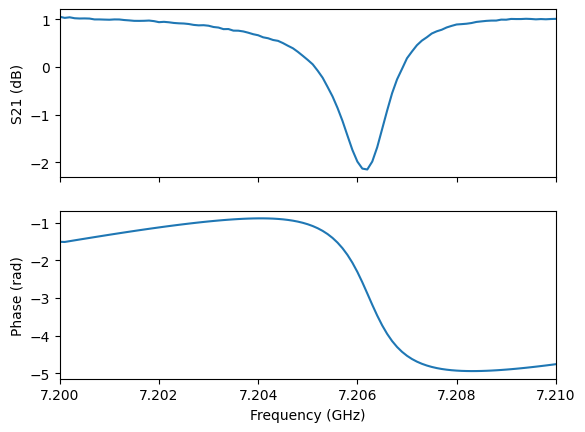

In [32]:
fig, data = vna_trace(vna, run=True)

In [28]:
vna.stop()-vna.start()

8000000000.0

{'a': 1.099, 'b': 0.2654, 'f0': 7206226100.0, 'kappa': 1497000.0, 'kappa_int': 230000.0, 'kappa_ext': 1267000.0, 'Q': 4813.0, 'Qi': 31300.0, 'Qe': 5687.0, 'phi': -3.142, 'tau': 2.518e-07, 'a_sd': 0.00083, 'b_sd': 0.00082, 'f0_sd': 1300.0, 'kappa_sd': 2900.0, 'kappa_int_sd': 1800.0, 'kappa_ext_sd': 1800.0, 'Q_sd': 9.2, 'Qi_sd': 310.0, 'Qe_sd': 16.0, 'phi_sd': 0.0022, 'tau_sd': 2.6e-10}


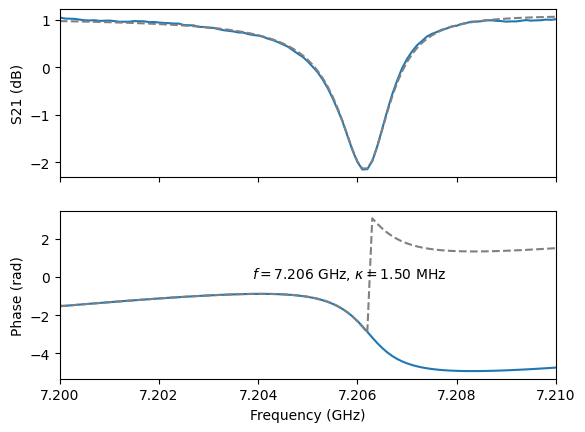

In [33]:
vna.format('PHAS')

fig, data = vna_trace(vna, run=True)
params, cov, chi = resonator_regression(data.index.to_numpy(), data['I'] + 1j*data['Q'])

# rparams = hanger_resonator_params(*params, covar=cov)
rparams = reflection_resonator_params(*params, covar=cov)
smith = resonator_f_to_S(data.index.to_numpy(), *params)
fig.axes[0].plot(data.index/1e9, 20*np.log10(np.abs(smith)), '--', color='gray')
fig.axes[1].plot(data.index/1e9, np.angle(smith), '--', color='gray')

# txt = f'$f = {rparams["f0"]/1e9:.3f}$ GHz, $\\kappa = {rparams["kappa"]/1e6:.2f}$ MHz, \n $\\ Qi = {rparams["Qi"]}$ '
txt = f'$f = {rparams["f0"]/1e9:.3f}$ GHz, $\\kappa = {rparams["kappa"]/1e6:.2f}$ MHz '

fig.axes[1].text(0.78, 0.6, txt, ha='right', transform=fig.axes[1].transAxes)
print(rparams)

# Punchout

In [36]:
qubit

'F2'

In [85]:
punchout_powers = np.linspace(-70, 10, 41)

In [86]:
punchout_powers

array([-70., -68., -66., -64., -62., -60., -58., -56., -54., -52., -50.,
       -48., -46., -44., -42., -40., -38., -36., -34., -32., -30., -28.,
       -26., -24., -22., -20., -18., -16., -14., -12., -10.,  -8.,  -6.,
        -4.,  -2.,   0.,   2.,   4.,   6.,   8.,  10.])

In [87]:
name = f'punchout_{device}-{qubit}.csv'

20it [00:43,  2.14s/it]C:\Users\LBNguyen\AppData\Local\Temp\ipykernel_18096\1403135313.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, sharex=True)
41it [01:28,  2.15s/it]


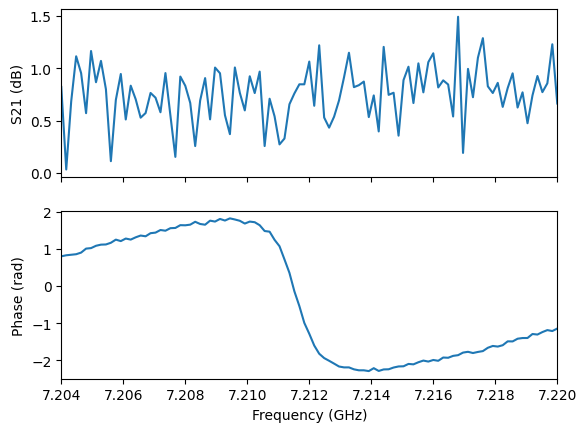

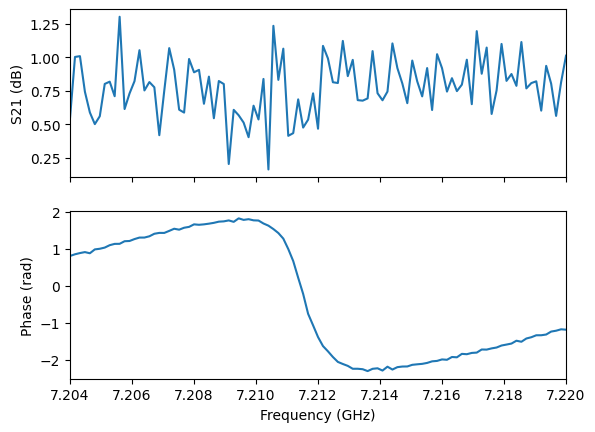

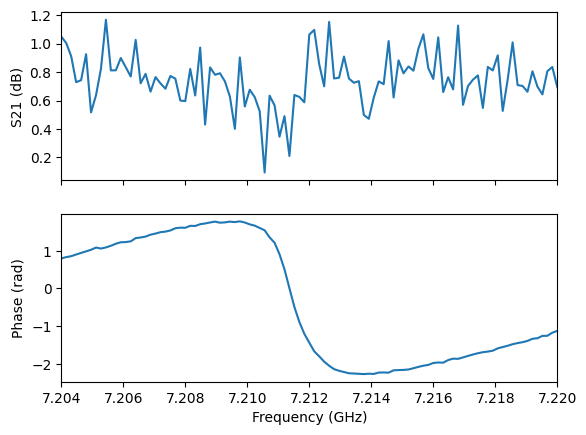

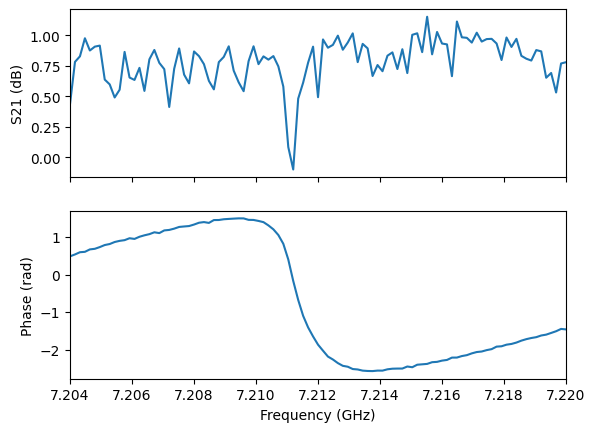

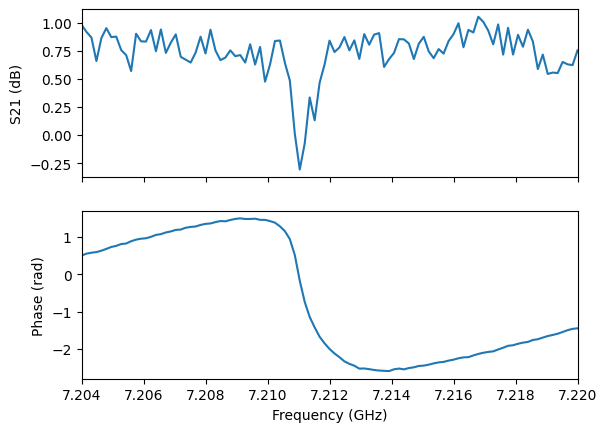

...

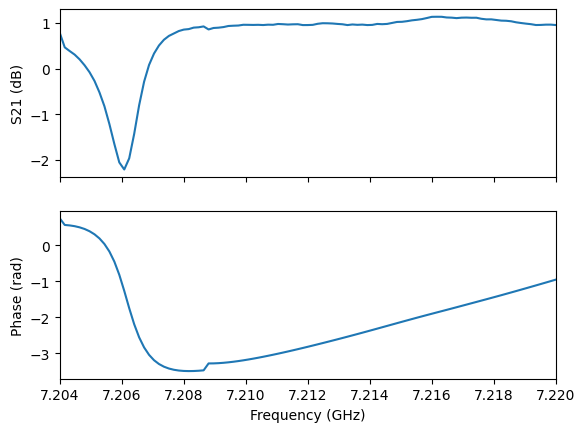

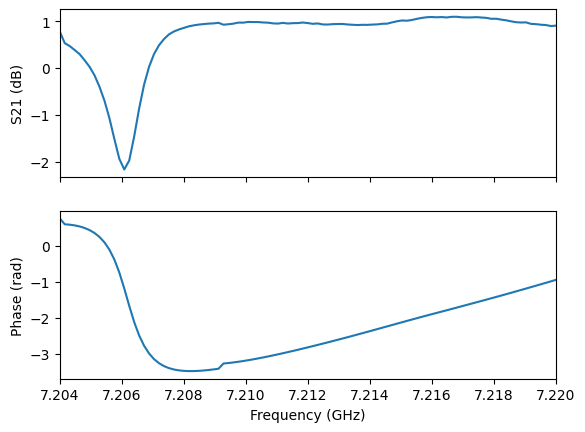

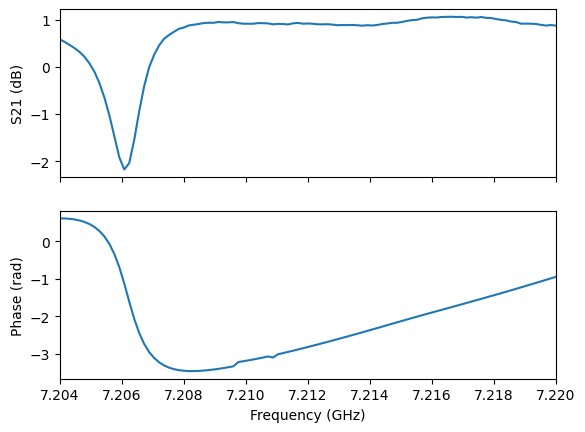

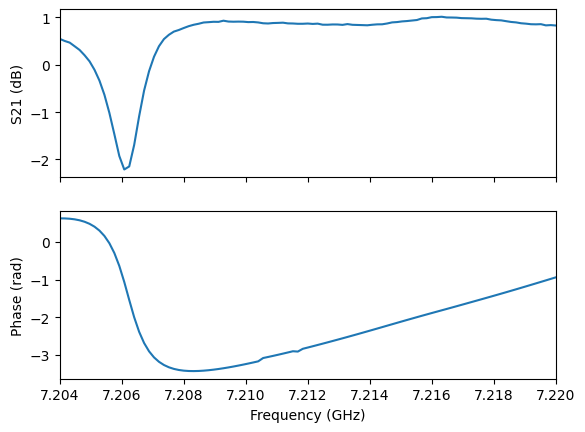

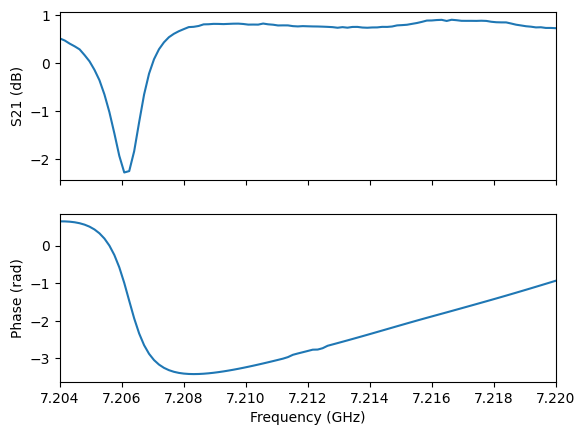

In [88]:
sweeps = []

for i, power in tqdm(enumerate(punchout_powers)):
    vna.port1.source_power(power)
    fig, data = vna_trace(vna, run=True)
    
    sweeps.append(data) # assuming frequencies are fixed throughout the punchout sweep
    
data = pd.concat(sweeps, keys=punchout_powers[:i+1], names=['power'])
data.to_csv(datadir / name)

## Plot 2D

In [89]:
# name = 'punchout_2d_dolan_fluxonium_icicle-f2.csv'
# datadir = datadir = Path('data/' + '2024-02-06')


In [93]:
punchout = pd.read_csv(datadir / name, index_col=[0, 1])

In [94]:
punchout['amplitude'].to_numpy().shape

(4141,)

In [95]:
plotting_data_amplitude = punchout['amplitude'].to_numpy().reshape((len(punchout_powers), 101))
plotting_data_phase = punchout['phase'].to_numpy().reshape((len(punchout_powers), 101))

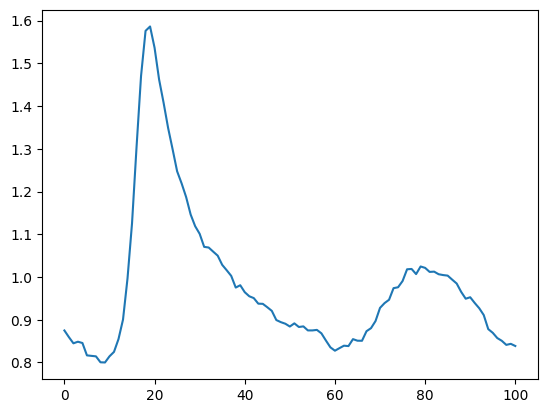

In [96]:

plt.plot(plotting_data_amplitude[20])

Text(0, 0.5, 'Frequency')

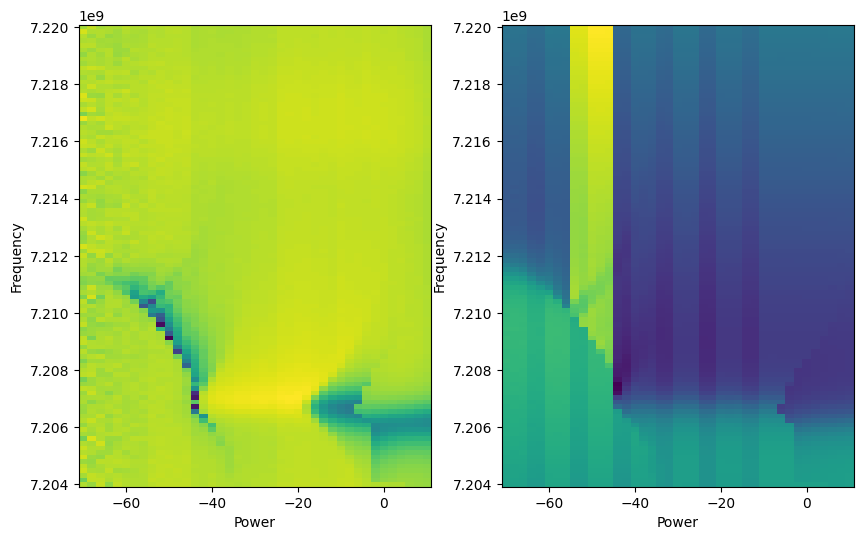

In [97]:
fig, ax = plt.subplots(1, 2, figsize=(10,6))
ax[0].pcolormesh(punchout_powers, np.linspace(vna.start(), vna.stop(), vna.points()),plotting_data_amplitude.transpose())
ax[0].set_xlabel('Power')
ax[0].set_ylabel('Frequency')
ax[1].pcolormesh(punchout_powers, np.linspace(vna.start(), vna.stop(), vna.points()),plotting_data_phase.transpose())
ax[1].set_xlabel('Power')
ax[1].set_ylabel('Frequency')

In [426]:
fig.savefig(str(datadir) + f'/punchout_{device}-{qubit}_1mA offset')

# Flux Tuning

## Connect to Yoko

### Yoko

In [50]:
from qcodes.instrument_drivers.yokogawa.GS200 import GS200

In [51]:
yoko = GS200(name='yoko', address='TCPIP::192.168.4.208')

Connected to: YOKOGAWA GS210 (serial:91PC11413, firmware:2.02) in 0.03s


In [52]:
yoko.on()

In [53]:
# yoko.source_mode('CURR')
yoko.current_limit(10e-3)
yoko.range(10e-3)

In [164]:
yoko.ramp_current(0e-3, step=1e-4, delay=0.3)

In [54]:
yoko.current()

0.0

### Measure

In [98]:

vna.port1.source_power(-60),
vna.points(101),
vna.averages(1),
vna.if_bandwidth(50),
vna.start(7.204e9),
vna.stop(7.22e9)


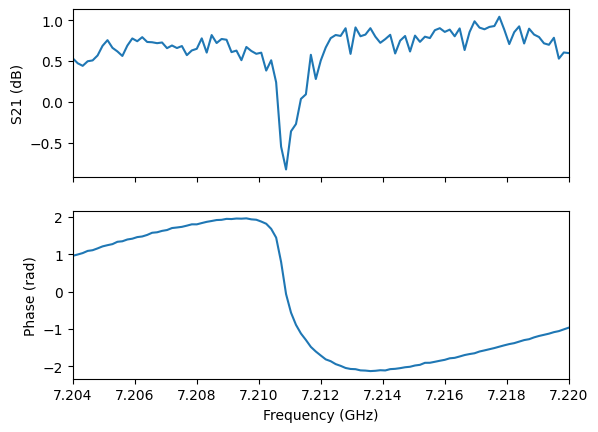

In [99]:
fig, data = vna_trace(vna, run=True)
# ax.axvline(np.linspace(vna.start(), vna.stop(), vna.points())[int(vna.points()/2)])

In [155]:
start_current = -4.0 #mA
end_current = 4.0 #mA
num_sweep = 401
name = f'{device}_{qubit}_{start_current}mAto{end_current}mA_2.csv'
currents = np.linspace(start_current, end_current, num_sweep) * 1e-3
yoko.current()

-0.004

### Yoko Sweep

In [156]:
sweeps = []

yoko.on()
for i, current in tqdm(enumerate(currents)):
    yoko.ramp_current(current, step=1e-4, delay=0.05)
    time.sleep(2)
    data = vna_trace_no_fig(vna, run=True)
    
    sweeps.append(data) # assuming frequencies are fixed throughout the punchout sweep
    
data = pd.concat(sweeps, keys=currents[:i+1], names=['power'])
data.to_csv(datadir/name)

401it [26:40,  3.99s/it]


### Plot One Tone Flux Sweep

In [157]:
flux_sweep = pd.read_csv(datadir / name, index_col=[0, 1])

In [158]:
plotting_data_flux_sweep = flux_sweep['amplitude'].to_numpy().reshape((len(currents), 101))

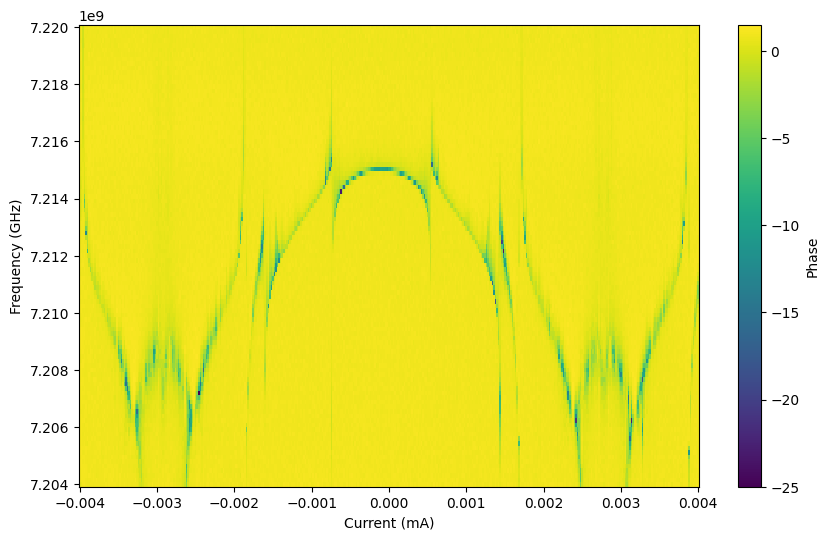

In [159]:
fig, ax = plt.subplots(figsize=(10,6))
im = ax.pcolormesh(currents, np.linspace(vna.start(), vna.stop(), vna.points()),plotting_data_flux_sweep.transpose())
ax.set_xlabel('Current (mA)')
ax.set_ylabel('Frequency (GHz)')
fig.colorbar(im, label="Phase")
# ax.axhline(np.linspace(vna.start(), vna.stop(), vna.points())[47], color='red')
# ax.set_ylim(np.array([7.2,7.215])*1e9)

In [160]:
flux_sweep2 = pd.read_csv(datadir / '2d_dolan_fluxonium_icicle_F2_4.0mAto-4.0mA_2.csv', index_col=[0, 1])

In [161]:
plotting_data_flux_sweep2 = flux_sweep2['amplitude'].to_numpy().reshape((len(currents), 101))

Text(0, 0.5, 'Frequency (GHz)')

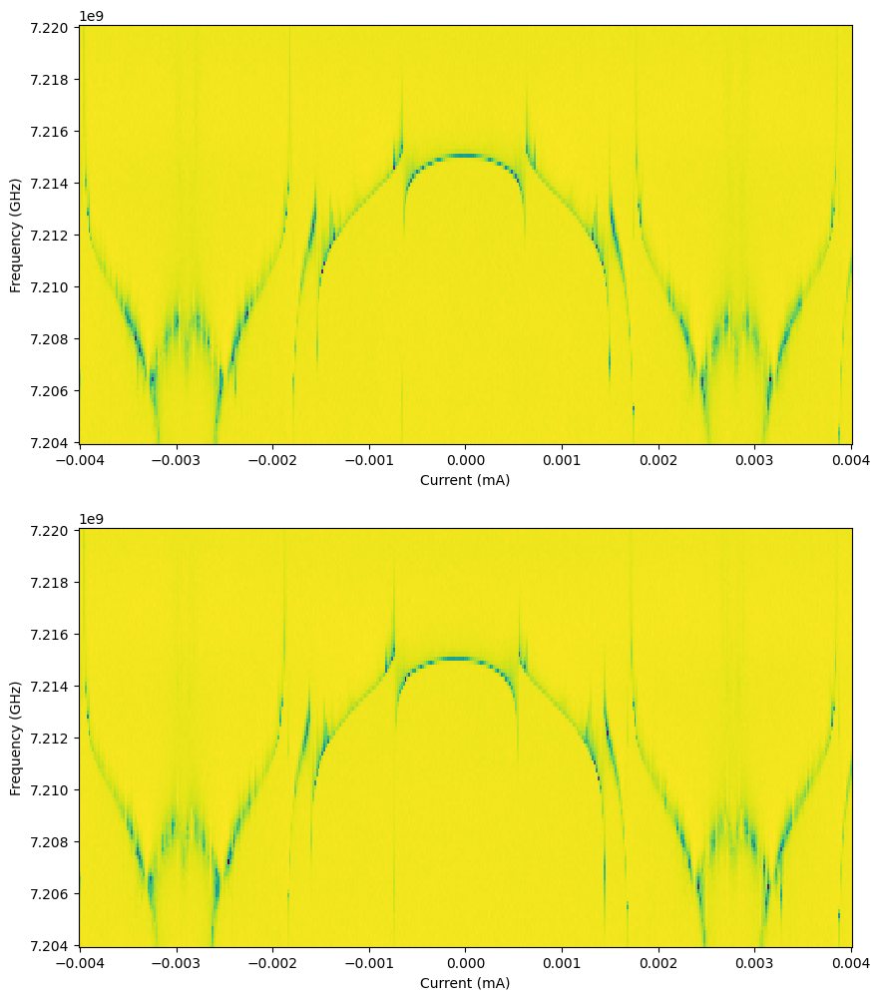

In [162]:
fig, axs = plt.subplots(figsize=(10,12), nrows=2)
im = axs[0].pcolormesh(currents[::-1], np.linspace(vna.start(), vna.stop(), vna.points()),plotting_data_flux_sweep2.transpose())
axs[0].set_xlabel('Current (mA)')
axs[0].set_ylabel('Frequency (GHz)')

im = axs[1].pcolormesh(currents, np.linspace(vna.start(), vna.stop(), vna.points()),plotting_data_flux_sweep.transpose())
axs[1].set_xlabel('Current (mA)')
axs[1].set_ylabel('Frequency (GHz)')


# fig.colorbar(im, label="Phase")
# ax.axhline(np.linspace(vna.start(), vna.stop(), vna.points())[47], color='red')
# ax.set_ylim(np.array([7.2,7.215])*1e9)

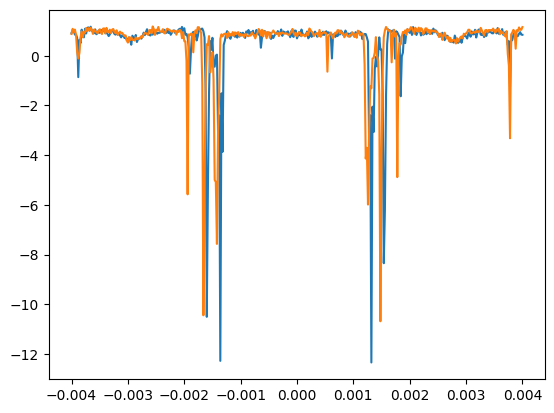

In [168]:
index = 50

plt.plot(currents[::-1], plotting_data_flux_sweep2.transpose()[index])
plt.plot(currents, plotting_data_flux_sweep.transpose()[index])

In [250]:
fig.savefig(str(datadir) + f'/flux_sweep_{device}-{qubit}')

# Two Tone

In [25]:
yoko.ramp_current(0.0e-3, step=1e-4, delay=0.3)
yoko.current()

0.0

{'a': 1.4, 'b': -0.3, 'f0': 7210900000.0, 'kappa': -10000000.0, 'kappa_int': -3100000.0, 'kappa_ext': 7000000.0, 'Q': -710.0, 'Qi': -2300.0, 'Qe': 1000.0, 'phi': 0.0, 'tau': -5.4e-08, 'a_sd': 0.12, 'b_sd': 0.091, 'f0_sd': 450000.0, 'kappa_sd': 1500000.0, 'kappa_int_sd': 720000.0, 'kappa_ext_sd': 820000.0, 'Q_sd': 100.0, 'Qi_sd': 350.0, 'Qe_sd': 240.0, 'phi_sd': 0.11, 'tau_sd': 1.6e-08}


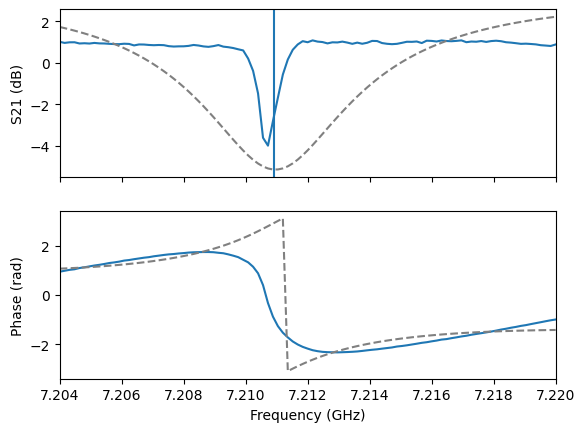

In [169]:
vna.two_tone_mode(two_tone_port=3, mode=False, frequency = 7298958000.0)

# vna.start(7.330*1e9)
# vna.stop(7.332*1e9)
# vna.port1.source_power(-8)
vna.points(101)
vna.averages(1)
vna.if_bandwidth(10)

fig, data = vna_trace(vna, run=True)
params, cov, chi = resonator_regression(data.index.to_numpy(), data['I'] + 1j*data['Q'])
rparams = reflection_resonator_params(*params, covar=cov)
smith = resonator_f_to_S(data.index.to_numpy(), *params)
fig.axes[0].plot(data.index/1e9, 20*np.log10(np.abs(smith)), '--', color='gray')
fig.axes[1].plot(data.index/1e9, np.angle(smith), '--', color='gray')
fig.axes[0].axvline(rparams['f0']/1e9)

print(rparams)

In [170]:
two_tone_start = 0.2*1e9
two_tone_end = 6.2*1e9
two_tone_power = -10
two_tone_points = 1201

In [173]:
vna.ports[2]

<PNAPort: vna_port3 of N5241B: vna>

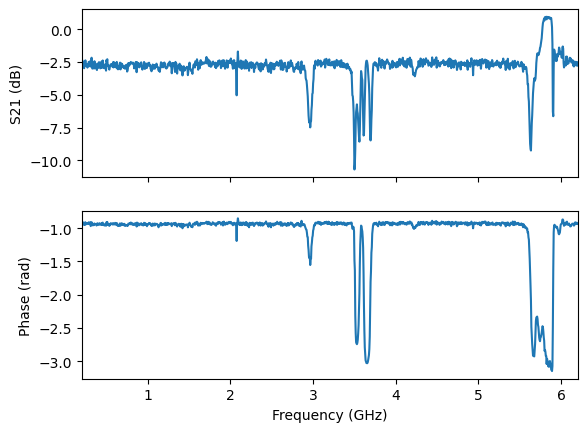

In [174]:
vna.two_tone_mode(two_tone_port=3, mode=True, frequency = rparams['f0'])
vna.if_bandwidth(10)
vna.points(two_tone_points)
vna.start(two_tone_start)
vna.stop(two_tone_end)
vna.averages(1)
vna.ports[2].source_power(two_tone_power)

fig, data = vna_trace(vna, run=True)

### single sweeps

In [176]:
coil_currents =  np.linspace(4, -4, 201) * 1e-3 #in mA
coil_step = 1e-4
two_tone_power = -10

In [177]:
coil_currents

array([ 4.00e-03,  3.96e-03,  3.92e-03,  3.88e-03,  3.84e-03,  3.80e-03,
        3.76e-03,  3.72e-03,  3.68e-03,  3.64e-03,  3.60e-03,  3.56e-03,
        3.52e-03,  3.48e-03,  3.44e-03,  3.40e-03,  3.36e-03,  3.32e-03,
        3.28e-03,  3.24e-03,  3.20e-03,  3.16e-03,  3.12e-03,  3.08e-03,
        3.04e-03,  3.00e-03,  2.96e-03,  2.92e-03,  2.88e-03,  2.84e-03,
        2.80e-03,  2.76e-03,  2.72e-03,  2.68e-03,  2.64e-03,  2.60e-03,
        2.56e-03,  2.52e-03,  2.48e-03,  2.44e-03,  2.40e-03,  2.36e-03,
        2.32e-03,  2.28e-03,  2.24e-03,  2.20e-03,  2.16e-03,  2.12e-03,
        2.08e-03,  2.04e-03,  2.00e-03,  1.96e-03,  1.92e-03,  1.88e-03,
        1.84e-03,  1.80e-03,  1.76e-03,  1.72e-03,  1.68e-03,  1.64e-03,
        1.60e-03,  1.56e-03,  1.52e-03,  1.48e-03,  1.44e-03,  1.40e-03,
        1.36e-03,  1.32e-03,  1.28e-03,  1.24e-03,  1.20e-03,  1.16e-03,
        1.12e-03,  1.08e-03,  1.04e-03,  1.00e-03,  9.60e-04,  9.20e-04,
        8.80e-04,  8.40e-04,  8.00e-04,  7.60e-04, 

0it [00:00, ?it/s]

Current is: coil:0.004
Resonator frequency is: 7.2109 GHz


1it [01:52, 112.48s/it]

Current is: coil:0.00396
Resonator frequency is: 7.2096 GHz


2it [03:45, 112.52s/it]

Current is: coil:0.00392
Resonator frequency is: 7.208115 GHz


3it [05:37, 112.57s/it]

Current is: coil:0.0038799999999999998
Resonator frequency is: 7.20448 GHz


4it [07:30, 112.55s/it]

Current is: coil:0.00384
Resonator frequency is: 7.21304 GHz


5it [09:22, 112.52s/it]

Current is: coil:0.0038
Resonator frequency is: 7.2116 GHz


6it [11:15, 112.51s/it]

Current is: coil:0.00376
Resonator frequency is: 7.2108 GHz


7it [13:07, 112.56s/it]

Current is: coil:0.0037199999999999998
Resonator frequency is: 7.2107 GHz


8it [15:00, 112.55s/it]

Current is: coil:0.00368
Resonator frequency is: 7.2105 GHz


9it [16:52, 112.55s/it]

Current is: coil:0.00364
Resonator frequency is: 7.2103 GHz


10it [18:45, 112.52s/it]

Current is: coil:0.0036000000000000003
Resonator frequency is: 7.2099 GHz


11it [20:38, 112.60s/it]

Current is: coil:0.0035600000000000002
Resonator frequency is: 7.2096 GHz


12it [22:30, 112.59s/it]

Current is: coil:0.00352
Resonator frequency is: 7.2092 GHz


13it [24:23, 112.56s/it]

Current is: coil:0.00348
Resonator frequency is: 7.2085 GHz


14it [26:15, 112.52s/it]

Current is: coil:0.00344
Resonator frequency is: 7.2079 GHz


15it [28:08, 112.53s/it]

Current is: coil:0.0034
Resonator frequency is: 7.2062 GHz


16it [30:00, 112.52s/it]

Current is: coil:0.00336
Resonator frequency is: 7.208493 GHz


17it [31:53, 112.56s/it]

Current is: coil:0.00332
Resonator frequency is: 7.2081 GHz


18it [33:45, 112.53s/it]

Current is: coil:0.0032800000000000004
Resonator frequency is: 7.207586 GHz


19it [35:38, 112.52s/it]

Current is: coil:0.0032400000000000003
Resonator frequency is: 7.20682 GHz


20it [37:30, 112.49s/it]

Current is: coil:0.0032


C:\Users\LBNguyen\AppData\Local\Temp\ipykernel_18096\1403135313.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 1, sharex=True)


Resonator frequency is: 7.206517 GHz


21it [39:23, 112.51s/it]

Current is: coil:0.00316
Resonator frequency is: 7.20644 GHz


22it [41:15, 112.53s/it]

Current is: coil:0.0031200000000000004
Resonator frequency is: 7.20589 GHz


23it [43:08, 112.58s/it]

Current is: coil:0.0030800000000000003
Resonator frequency is: 7.1994 GHz


24it [45:01, 112.56s/it]

Current is: coil:0.00304
Resonator frequency is: 7.202 GHz


25it [46:53, 112.55s/it]

Current is: coil:0.003
Resonator frequency is: 7.21119 GHz


26it [48:46, 112.53s/it]

Current is: coil:0.00296
Resonator frequency is: 7.2043 GHz


27it [50:38, 112.54s/it]

Current is: coil:0.00292
Resonator frequency is: 7.20852 GHz


28it [52:31, 112.55s/it]

Current is: coil:0.0028799999999999997
Resonator frequency is: 7.2115 GHz


29it [54:23, 112.54s/it]

Current is: coil:0.00284
Resonator frequency is: 7.2116 GHz


30it [56:16, 112.53s/it]

Current is: coil:0.0028
Resonator frequency is: 7.2088 GHz


31it [58:08, 112.51s/it]

Current is: coil:0.00276
Resonator frequency is: 7.2096 GHz


32it [1:00:01, 112.51s/it]

Current is: coil:0.0027199999999999998
Resonator frequency is: 7.20865 GHz


33it [1:01:53, 112.58s/it]

Current is: coil:0.0026799999999999997
Resonator frequency is: 7.21174 GHz


34it [1:03:46, 112.53s/it]

Current is: coil:0.0026399999999999996
Resonator frequency is: 7.202 GHz


35it [1:05:38, 112.51s/it]

Current is: coil:0.0026
Resonator frequency is: 7.2079 GHz


36it [1:07:31, 112.52s/it]

Current is: coil:0.00256
Resonator frequency is: 7.20756 GHz


37it [1:09:23, 112.52s/it]

Current is: coil:0.00252
Resonator frequency is: 7.20325 GHz


38it [1:11:16, 112.56s/it]

Current is: coil:0.00248
Resonator frequency is: 7.20546 GHz


39it [1:13:08, 112.54s/it]

Current is: coil:0.00244
Resonator frequency is: 7.2093 GHz


40it [1:15:01, 112.54s/it]

Current is: coil:0.0024
Resonator frequency is: 7.206788 GHz


41it [1:16:54, 112.53s/it]

Current is: coil:0.00236
Resonator frequency is: 7.207475 GHz


42it [1:18:46, 112.50s/it]

Current is: coil:0.0023200000000000004
Resonator frequency is: 7.21 GHz


43it [1:20:38, 112.51s/it]

Current is: coil:0.0022800000000000003
Resonator frequency is: 7.208372 GHz


44it [1:22:31, 112.52s/it]

Current is: coil:0.0022400000000000002
Resonator frequency is: 7.208757 GHz


45it [1:24:24, 112.52s/it]

Current is: coil:0.0022
Resonator frequency is: 7.2068 GHz


46it [1:26:16, 112.58s/it]

Current is: coil:0.00216
Resonator frequency is: 7.2084 GHz


47it [1:28:09, 112.60s/it]

Current is: coil:0.0021200000000000004
Resonator frequency is: 7.2088 GHz


48it [1:30:01, 112.60s/it]

Current is: coil:0.0020800000000000003
Resonator frequency is: 7.2094 GHz


49it [1:31:54, 112.55s/it]

Current is: coil:0.00204
Resonator frequency is: 7.2098 GHz


50it [1:33:46, 112.55s/it]

Current is: coil:0.002
Resonator frequency is: 7.2101 GHz


51it [1:35:39, 112.64s/it]

Current is: coil:0.00196
Resonator frequency is: 7.2104 GHz


52it [1:37:32, 112.58s/it]

Current is: coil:0.00192
Resonator frequency is: 7.2106 GHz


53it [1:39:24, 112.56s/it]

Current is: coil:0.00188
Resonator frequency is: 7.2108 GHz


54it [1:41:17, 112.55s/it]

Current is: coil:0.0018399999999999998
Resonator frequency is: 7.211 GHz


55it [1:43:09, 112.55s/it]

Current is: coil:0.0018
Resonator frequency is: 7.21188 GHz


56it [1:45:02, 112.55s/it]

Current is: coil:0.0017599999999999998
Resonator frequency is: 7.2158 GHz


57it [1:46:54, 112.53s/it]

Current is: coil:0.0017199999999999997
Resonator frequency is: 7.207047 GHz


58it [1:48:47, 112.51s/it]

Current is: coil:0.0016800000000000003
Resonator frequency is: 7.2078 GHz


59it [1:50:39, 112.49s/it]

Current is: coil:0.0016400000000000002
Resonator frequency is: 7.2105 GHz


60it [1:52:32, 112.50s/it]

Current is: coil:0.0016
Resonator frequency is: 7.2114 GHz


61it [1:54:24, 112.51s/it]

Current is: coil:0.0015600000000000002
Resonator frequency is: 7.2119 GHz


62it [1:56:17, 112.54s/it]

Current is: coil:0.00152
Resonator frequency is: 7.2123 GHz


63it [1:58:09, 112.53s/it]

Current is: coil:0.00148
Resonator frequency is: 7.20956 GHz


64it [2:00:02, 112.52s/it]

Current is: coil:0.0014399999999999999
Resonator frequency is: 7.21 GHz


65it [2:01:54, 112.49s/it]

Current is: coil:0.0014
Resonator frequency is: 7.2104 GHz


66it [2:03:47, 112.50s/it]

Current is: coil:0.0013599999999999999
Resonator frequency is: 7.2112 GHz


67it [2:05:39, 112.51s/it]

Current is: coil:0.0013199999999999998
Resonator frequency is: 7.2111 GHz


68it [2:07:32, 112.48s/it]

Current is: coil:0.0012799999999999999
Resonator frequency is: 7.2112 GHz


69it [2:09:24, 112.52s/it]

Current is: coil:0.0012399999999999998
Resonator frequency is: 7.2113 GHz


70it [2:11:17, 112.51s/it]

Current is: coil:0.0011999999999999997
Resonator frequency is: 7.2115 GHz


71it [2:13:10, 112.53s/it]

Current is: coil:0.0011600000000000002
Resonator frequency is: 7.2116 GHz


72it [2:15:02, 112.51s/it]

Current is: coil:0.0011200000000000001
Resonator frequency is: 7.2117 GHz


73it [2:16:54, 112.49s/it]

Current is: coil:0.00108
Resonator frequency is: 7.2118 GHz


74it [2:18:47, 112.49s/it]

Current is: coil:0.0010400000000000001
Resonator frequency is: 7.2119 GHz


75it [2:20:39, 112.49s/it]

Current is: coil:0.001
Resonator frequency is: 7.2121 GHz


76it [2:22:32, 112.49s/it]

Current is: coil:0.00096
Resonator frequency is: 7.2122 GHz


77it [2:24:25, 112.54s/it]

Current is: coil:0.0009199999999999999
Resonator frequency is: 7.2123 GHz


78it [2:26:17, 112.52s/it]

Current is: coil:0.0008799999999999999
Resonator frequency is: 7.2124 GHz


79it [2:28:10, 112.51s/it]

Current is: coil:0.0008399999999999999
Resonator frequency is: 7.2125 GHz


80it [2:30:02, 112.51s/it]

Current is: coil:0.0007999999999999998
Resonator frequency is: 7.2127 GHz


81it [2:31:55, 112.52s/it]

Current is: coil:0.0007599999999999998
Resonator frequency is: 7.2128 GHz


82it [2:33:47, 112.52s/it]

Current is: coil:0.0007199999999999997
Resonator frequency is: 7.2135 GHz


83it [2:35:40, 112.50s/it]

Current is: coil:0.0006799999999999997
Resonator frequency is: 7.2136 GHz


84it [2:37:32, 112.50s/it]

Current is: coil:0.0006400000000000002
Resonator frequency is: 7.2143 GHz


85it [2:39:25, 112.52s/it]

Current is: coil:0.0006000000000000001
Resonator frequency is: 7.21245 GHz


86it [2:41:17, 112.49s/it]

Current is: coil:0.0005600000000000001
Resonator frequency is: 7.2127 GHz


87it [2:43:10, 112.50s/it]

Current is: coil:0.0005200000000000001
Resonator frequency is: 7.2128 GHz


88it [2:45:02, 112.50s/it]

Current is: coil:0.00048
Resonator frequency is: 7.2129 GHz


89it [2:46:55, 112.49s/it]

Current is: coil:0.00043999999999999996
Resonator frequency is: 7.213 GHz


90it [2:48:47, 112.48s/it]

Current is: coil:0.0003999999999999999
Resonator frequency is: 7.2131 GHz


91it [2:50:39, 112.48s/it]

Current is: coil:0.00035999999999999986
Resonator frequency is: 7.2132 GHz


92it [2:52:32, 112.49s/it]

Current is: coil:0.00031999999999999986
Resonator frequency is: 7.2133 GHz


93it [2:54:25, 112.55s/it]

Current is: coil:0.0002799999999999998
Resonator frequency is: 7.2133 GHz


94it [2:56:17, 112.51s/it]

Current is: coil:0.00023999999999999976
Resonator frequency is: 7.2134 GHz


95it [2:58:10, 112.53s/it]

Current is: coil:0.00019999999999999974
Resonator frequency is: 7.2135 GHz


96it [3:00:02, 112.52s/it]

Current is: coil:0.00016000000000000015
Resonator frequency is: 7.2136 GHz


97it [3:01:55, 112.49s/it]

Current is: coil:0.00012000000000000011
Resonator frequency is: 7.2135 GHz


98it [3:03:47, 112.50s/it]

Current is: coil:8.000000000000007e-05
Resonator frequency is: 7.2136 GHz


99it [3:05:40, 112.50s/it]

Current is: coil:4.000000000000004e-05
Resonator frequency is: 7.2136 GHz


100it [3:07:32, 112.49s/it]

Current is: coil:0.0
Resonator frequency is: 7.2136 GHz


101it [3:09:25, 112.51s/it]

Current is: coil:-4.000000000000004e-05
Resonator frequency is: 7.2136 GHz


102it [3:11:17, 112.49s/it]

Current is: coil:-8.000000000000007e-05
Resonator frequency is: 7.2136 GHz


103it [3:13:10, 112.62s/it]

Current is: coil:-0.00012000000000000011
Resonator frequency is: 7.21362 GHz


104it [3:15:03, 112.59s/it]

Current is: coil:-0.00016000000000000015
Resonator frequency is: 7.2135 GHz


105it [3:16:55, 112.56s/it]

Current is: coil:-0.00020000000000000017
Resonator frequency is: 7.21359 GHz


106it [3:18:48, 112.54s/it]

Current is: coil:-0.00024000000000000022
Resonator frequency is: 7.2134 GHz


107it [3:20:40, 112.52s/it]

Current is: coil:-0.00028000000000000025
Resonator frequency is: 7.2134 GHz


108it [3:22:32, 112.51s/it]

Current is: coil:-0.0003200000000000003
Resonator frequency is: 7.2133 GHz


109it [3:24:25, 112.52s/it]

Current is: coil:-0.00036000000000000035
Resonator frequency is: 7.2132 GHz


110it [3:26:17, 112.50s/it]

Current is: coil:-0.00040000000000000034
Resonator frequency is: 7.2131 GHz


111it [3:28:10, 112.50s/it]

Current is: coil:-0.0004400000000000004
Resonator frequency is: 7.213 GHz


112it [3:30:02, 112.51s/it]

Current is: coil:-0.00048000000000000045
Resonator frequency is: 7.2129 GHz


113it [3:31:55, 112.49s/it]

Current is: coil:-0.0005200000000000005
Resonator frequency is: 7.2128 GHz


114it [3:33:47, 112.48s/it]

Current is: coil:-0.0005600000000000005
Resonator frequency is: 7.2128 GHz


115it [3:35:40, 112.48s/it]

Current is: coil:-0.0006000000000000006
Resonator frequency is: 7.21257 GHz


116it [3:37:32, 112.48s/it]

Current is: coil:-0.0006399999999999997
Resonator frequency is: 7.2121 GHz


117it [3:39:25, 112.48s/it]

Current is: coil:-0.0006799999999999997
Resonator frequency is: 7.2137 GHz


118it [3:41:17, 112.47s/it]

Current is: coil:-0.0007199999999999997
Resonator frequency is: 7.2134 GHz


119it [3:43:10, 112.48s/it]

Current is: coil:-0.0007599999999999998
Resonator frequency is: 7.213 GHz


120it [3:45:02, 112.47s/it]

Current is: coil:-0.0007999999999999998
Resonator frequency is: 7.2128 GHz


121it [3:46:55, 112.47s/it]

Current is: coil:-0.0008399999999999999
Resonator frequency is: 7.2126 GHz


122it [3:48:47, 112.48s/it]

Current is: coil:-0.0008799999999999999
Resonator frequency is: 7.2125 GHz


123it [3:50:40, 112.47s/it]

Current is: coil:-0.0009199999999999999
Resonator frequency is: 7.2123 GHz


124it [3:52:32, 112.48s/it]

Current is: coil:-0.00096
Resonator frequency is: 7.2122 GHz


125it [3:54:25, 112.55s/it]

Current is: coil:-0.001
Resonator frequency is: 7.2121 GHz


126it [3:56:17, 112.50s/it]

Current is: coil:-0.0010400000000000001
Resonator frequency is: 7.212 GHz


127it [3:58:10, 112.50s/it]

Current is: coil:-0.00108
Resonator frequency is: 7.2119 GHz


128it [4:00:02, 112.50s/it]

Current is: coil:-0.0011200000000000001
Resonator frequency is: 7.2118 GHz


129it [4:01:55, 112.49s/it]

Current is: coil:-0.0011600000000000002
Resonator frequency is: 7.2117 GHz


130it [4:03:47, 112.49s/it]

Current is: coil:-0.0012000000000000001
Resonator frequency is: 7.2116 GHz


131it [4:05:40, 112.49s/it]

Current is: coil:-0.0012400000000000002
Resonator frequency is: 7.2114 GHz


132it [4:07:32, 112.49s/it]

Current is: coil:-0.0012800000000000003
Resonator frequency is: 7.2113 GHz


133it [4:09:25, 112.54s/it]

Current is: coil:-0.0013200000000000002
Resonator frequency is: 7.2111 GHz


134it [4:11:17, 112.51s/it]

Current is: coil:-0.0013600000000000003
Resonator frequency is: 7.2112 GHz


135it [4:13:10, 112.52s/it]

Current is: coil:-0.0014000000000000004
Resonator frequency is: 7.2112 GHz


136it [4:15:02, 112.49s/it]

Current is: coil:-0.0014400000000000005
Resonator frequency is: 7.2105 GHz


137it [4:16:55, 112.48s/it]

Current is: coil:-0.0014800000000000004
Resonator frequency is: 7.21 GHz


138it [4:18:47, 112.47s/it]

Current is: coil:-0.0015200000000000005
Resonator frequency is: 7.20995 GHz


139it [4:20:40, 112.47s/it]

Current is: coil:-0.0015600000000000006
Resonator frequency is: 7.21232 GHz


140it [4:22:32, 112.49s/it]

Current is: coil:-0.0016000000000000005
Resonator frequency is: 7.2121 GHz


141it [4:24:25, 112.54s/it]

Current is: coil:-0.0016399999999999997
Resonator frequency is: 7.2115 GHz


142it [4:26:17, 112.52s/it]

Current is: coil:-0.0016799999999999999
Resonator frequency is: 7.2107 GHz


143it [4:28:10, 112.52s/it]

Current is: coil:-0.0017199999999999997
Resonator frequency is: 7.2089 GHz


144it [4:30:02, 112.55s/it]

Current is: coil:-0.0017599999999999998
Resonator frequency is: 7.207613 GHz


145it [4:31:55, 112.53s/it]

Current is: coil:-0.0018
Resonator frequency is: 7.21225 GHz


146it [4:33:47, 112.55s/it]

Current is: coil:-0.0018399999999999998
Resonator frequency is: 7.2124 GHz


147it [4:35:40, 112.53s/it]

Current is: coil:-0.00188
Resonator frequency is: 7.2113 GHz


148it [4:37:32, 112.49s/it]

Current is: coil:-0.00192
Resonator frequency is: 7.2108 GHz


149it [4:39:25, 112.54s/it]

Current is: coil:-0.00196
Resonator frequency is: 7.2106 GHz


150it [4:41:17, 112.51s/it]

Current is: coil:-0.002
Resonator frequency is: 7.2105 GHz


151it [4:43:10, 112.50s/it]

Current is: coil:-0.00204
Resonator frequency is: 7.2102 GHz


152it [4:45:02, 112.50s/it]

Current is: coil:-0.0020800000000000003
Resonator frequency is: 7.21 GHz


153it [4:46:55, 112.49s/it]

Current is: coil:-0.0021200000000000004
Resonator frequency is: 7.2096 GHz


154it [4:48:47, 112.48s/it]

Current is: coil:-0.00216
Resonator frequency is: 7.2092 GHz


155it [4:50:40, 112.49s/it]

Current is: coil:-0.0022
Resonator frequency is: 7.2086 GHz


156it [4:52:32, 112.50s/it]

Current is: coil:-0.0022400000000000002
Resonator frequency is: 7.2075 GHz


157it [4:54:25, 112.57s/it]

Current is: coil:-0.0022800000000000003
Resonator frequency is: 7.2064 GHz


158it [4:56:18, 112.54s/it]

Current is: coil:-0.0023200000000000004
Resonator frequency is: 7.208578 GHz


159it [4:58:10, 112.55s/it]

Current is: coil:-0.0023600000000000006
Resonator frequency is: 7.2097 GHz


160it [5:00:03, 112.55s/it]

Current is: coil:-0.0024000000000000002
Resonator frequency is: 7.20768 GHz


161it [5:01:55, 112.52s/it]

Current is: coil:-0.0024400000000000003
Resonator frequency is: 7.207155 GHz


162it [5:03:48, 112.52s/it]

Current is: coil:-0.0024800000000000004
Resonator frequency is: 7.206583 GHz


163it [5:05:40, 112.50s/it]

Current is: coil:-0.0025200000000000005
Resonator frequency is: 7.206367 GHz


164it [5:07:33, 112.49s/it]

Current is: coil:-0.0025600000000000006
Resonator frequency is: 7.20619 GHz


165it [5:09:25, 112.53s/it]

Current is: coil:-0.0026000000000000007
Resonator frequency is: 7.2021 GHz


166it [5:11:18, 112.54s/it]

Current is: coil:-0.0026400000000000004
Resonator frequency is: 7.1969 GHz


167it [5:13:11, 112.67s/it]

Current is: coil:-0.0026799999999999997
Resonator frequency is: 7.20798 GHz


168it [5:15:03, 112.63s/it]

Current is: coil:-0.0027199999999999998
Resonator frequency is: 7.21124 GHz


169it [5:16:56, 112.57s/it]

Current is: coil:-0.00276
Resonator frequency is: 7.208483 GHz


170it [5:18:48, 112.59s/it]

Current is: coil:-0.0028
Resonator frequency is: 7.2101 GHz


171it [5:20:41, 112.55s/it]

Current is: coil:-0.00284
Resonator frequency is: 7.2102 GHz


172it [5:22:33, 112.55s/it]

Current is: coil:-0.0028799999999999997
Resonator frequency is: 7.2 GHz


173it [5:24:26, 112.56s/it]

Current is: coil:-0.00292
Resonator frequency is: 7.2097 GHz


174it [5:26:18, 112.52s/it]

Current is: coil:-0.00296
Resonator frequency is: 7.21 GHz


175it [5:28:11, 112.55s/it]

Current is: coil:-0.003
Resonator frequency is: 7.20869 GHz


176it [5:30:04, 112.55s/it]

Current is: coil:-0.00304
Resonator frequency is: 7.202 GHz


177it [5:31:56, 112.52s/it]

Current is: coil:-0.0030800000000000003
Resonator frequency is: 7.20814 GHz


178it [5:33:49, 112.53s/it]

Current is: coil:-0.0031200000000000004
Resonator frequency is: 7.20796 GHz


179it [5:35:41, 112.51s/it]

Current is: coil:-0.00316
Resonator frequency is: 7.20757 GHz


180it [5:37:34, 112.53s/it]

Current is: coil:-0.0032
Resonator frequency is: 7.20387 GHz


181it [5:39:26, 112.58s/it]

Current is: coil:-0.0032400000000000003
Resonator frequency is: 7.20653 GHz


182it [5:41:19, 112.54s/it]

Current is: coil:-0.0032800000000000004
Resonator frequency is: 7.206474 GHz


183it [5:43:11, 112.54s/it]

Current is: coil:-0.0033200000000000005
Resonator frequency is: 7.206738 GHz


184it [5:45:04, 112.54s/it]

Current is: coil:-0.0033600000000000006
Resonator frequency is: 7.20743 GHz


185it [5:46:56, 112.52s/it]

Current is: coil:-0.0034000000000000002
Resonator frequency is: 7.2029 GHz


186it [5:48:49, 112.52s/it]

Current is: coil:-0.0034400000000000003
Resonator frequency is: 7.208392 GHz


187it [5:50:41, 112.53s/it]

Current is: coil:-0.0034800000000000005
Resonator frequency is: 7.208784 GHz


188it [5:52:34, 112.52s/it]

Current is: coil:-0.0035200000000000006
Resonator frequency is: 7.2074 GHz


189it [5:54:27, 112.54s/it]

Current is: coil:-0.0035600000000000007
Resonator frequency is: 7.2083 GHz


190it [5:56:19, 112.51s/it]

Current is: coil:-0.0036000000000000008
Resonator frequency is: 7.2089 GHz


191it [5:58:11, 112.51s/it]

Current is: coil:-0.0036400000000000004
Resonator frequency is: 7.2095 GHz


192it [6:00:04, 112.51s/it]

Current is: coil:-0.0036799999999999997
Resonator frequency is: 7.2098 GHz


193it [6:01:56, 112.49s/it]

Current is: coil:-0.0037199999999999998
Resonator frequency is: 7.2101 GHz


194it [6:03:49, 112.48s/it]

Current is: coil:-0.00376
Resonator frequency is: 7.2104 GHz


195it [6:05:41, 112.49s/it]

Current is: coil:-0.0038
Resonator frequency is: 7.2106 GHz


196it [6:07:34, 112.48s/it]

Current is: coil:-0.00384
Resonator frequency is: 7.2107 GHz


197it [6:09:27, 112.55s/it]

Current is: coil:-0.0038799999999999998
Resonator frequency is: 7.2109 GHz


198it [6:11:19, 112.51s/it]

Current is: coil:-0.00392
Resonator frequency is: 7.21167 GHz


199it [6:13:11, 112.50s/it]

Current is: coil:-0.00396
Resonator frequency is: 7.2243 GHz


200it [6:15:04, 112.52s/it]

Current is: coil:-0.004
Resonator frequency is: 7.2064 GHz


201it [6:16:56, 112.52s/it]


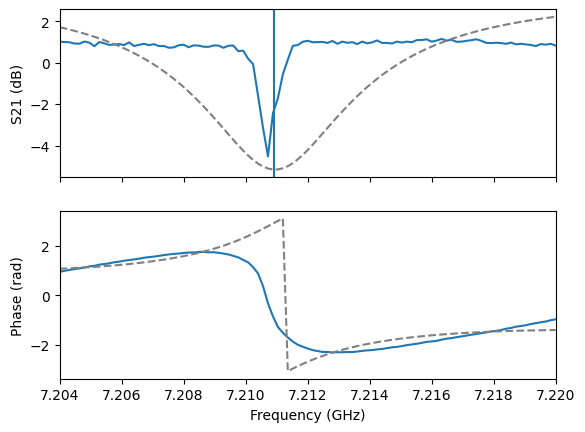

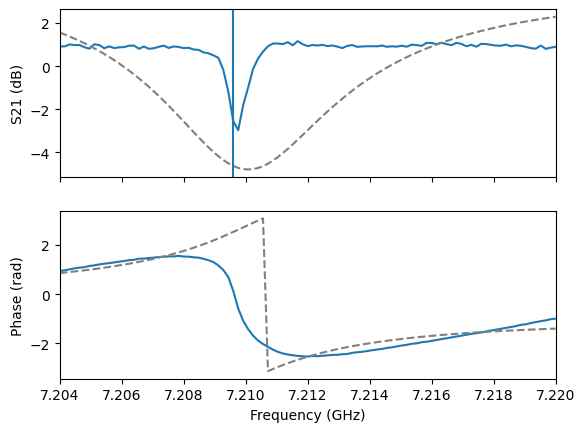

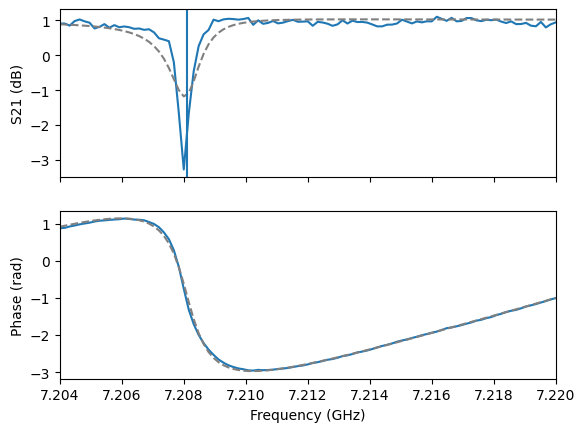

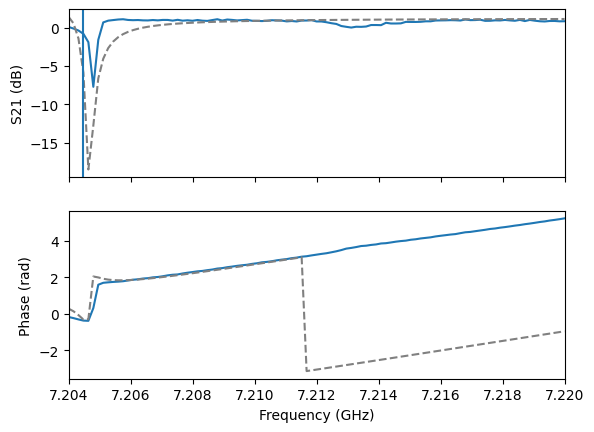

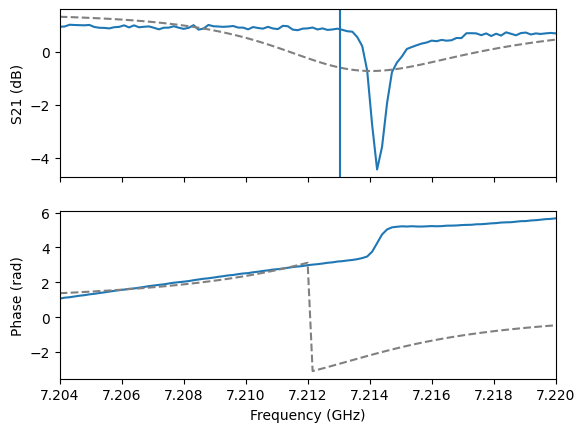

...

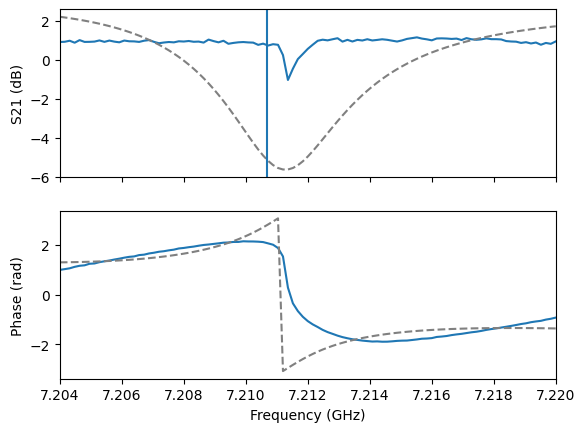

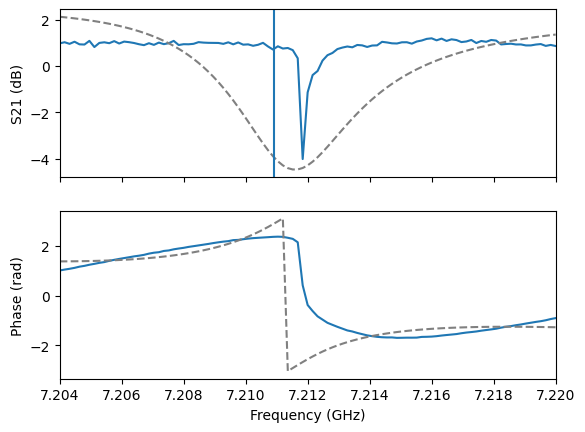

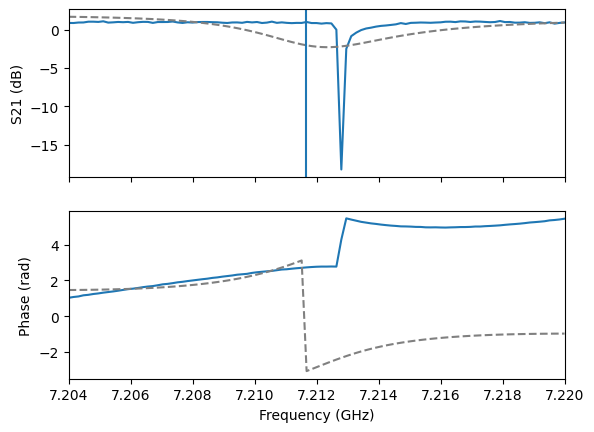

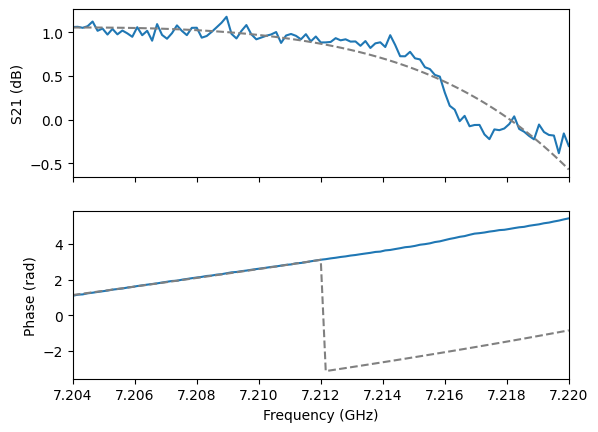

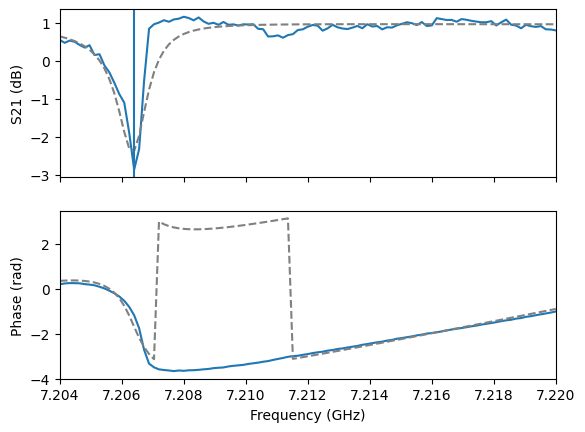

In [178]:
sweeps = []

for i, current_val in tqdm(enumerate(coil_currents)):
    print(f"Current is: coil:{current_val}" )
    yoko.on()
    yoko.ramp_current(current_val, step=coil_step, delay=0.1)
    time.sleep(0.2)
    
    ### Fit resonator
    vna.two_tone_mode(two_tone_port=3, mode=False, frequency = 7298958000.0)
    vna.start(7.204e9),
    vna.stop(7.22e9)
    vna.port1.source_power(-60)
    vna.points(101)
    vna.averages(1)
    vna.if_bandwidth(20)

    fig, data = vna_trace(vna, run=True)
    params, cov, chi = resonator_regression(data.index.to_numpy(), data['I'] + 1j*data['Q'])

    # Reflection_fitting
    rparams = reflection_resonator_params(*params, covar=cov)
    smith = resonator_f_to_S(data.index.to_numpy(), *params)
    fig.axes[0].plot(data.index/1e9, 20*np.log10(np.abs(smith)), '--', color='gray')
    fig.axes[0].axvline(rparams['f0']/1e9)
    fig.axes[1].plot(data.index/1e9, np.angle(smith), '--', color='gray')

    res_freq = rparams['f0']/1e9
    print(f'Resonator frequency is: {res_freq} GHz')
    
    ### Perform Two Tone       
    vna.two_tone_mode(two_tone_port=3, mode=True, frequency = rparams['f0'])
    vna.if_bandwidth(10)
    vna.points(two_tone_points)
    vna.start(two_tone_start)
    vna.stop(two_tone_end)
    vna.averages(1)
    vna.ports[2].source_power(two_tone_power)

    try:
        swp = vna_trace_no_fig(vna, run=True)
    except:
        try:
            print('Error')
            time.sleep(3)
            swp = vna_trace_no_fig(vna, run=False)
        except:
            print(f'Still error on {i}')

    sweeps += [swp]

name = str(date.today()) + f'_{device}_{qubit}-current_sweep_{two_tone_start}to{two_tone_end}GHz_{two_tone_power}dbm_2.csv'
data = pd.concat(sweeps, keys=coil_currents[:i+1], names=['Current'])
data.to_csv(datadir / name)

In [469]:
data1 = pd.concat(sweeps, keys = coil_currents, names=['Current'])

In [ ]:
plt.pcolormesh(np.array(data1['amplitude']).reshape((151,2001)).transpose())

## Plot Two Tone Data

In [450]:
name = str(date.today()) + f'_{device}_{qubit}-current_sweep_{two_tone_start}to{two_tone_end}GHz_{two_tone_power}dbm.csv'
data = pd.concat(sweeps, keys=coil_currents[:i+1], names=['Current'])
data.to_csv(datadir / name)

In [179]:
two_tone_sweep = pd.read_csv(datadir / name, index_col=[0, 1])

In [180]:
plotting_data_two_tone_sweep = two_tone_sweep['amplitude'].to_numpy().reshape((len(coil_currents), two_tone_points))

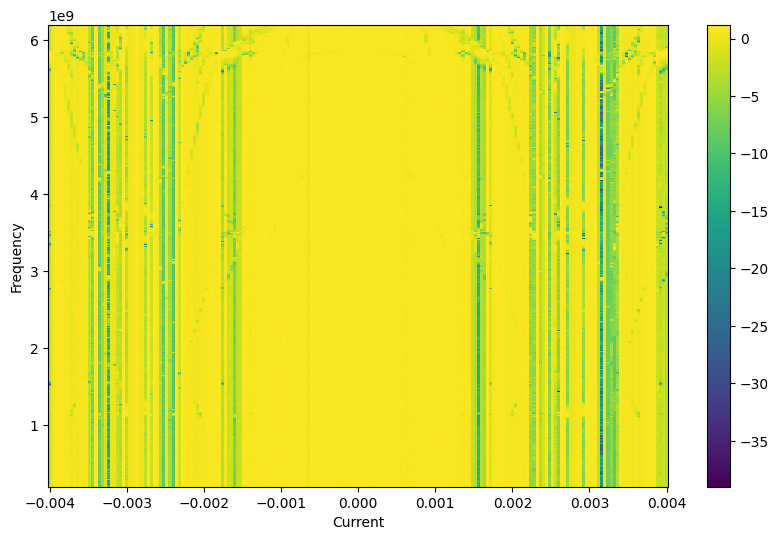

In [181]:
fig, ax = plt.subplots(figsize=(10,6))
im = ax.pcolormesh(coil_currents, np.linspace(two_tone_start, two_tone_end, two_tone_points),plotting_data_two_tone_sweep.transpose()
#              , vmin=-20, vmax=10
             )
ax.set_xlabel('Current')
ax.set_ylabel('Frequency')

fig.colorbar(im)


### Better Visibility

In [190]:
plotting_data_two_tone_sweep = np.array(two_tone_sweep['phase']).reshape((201,two_tone_points))

In [191]:
better_data = []

for row in np.array(plotting_data_two_tone_sweep):
#     row = np.unwrap(row)
    new_row = (row-np.median(row))/ abs(np.median(row))
    better_data.append(new_row)
    
better_data = np.array(better_data)

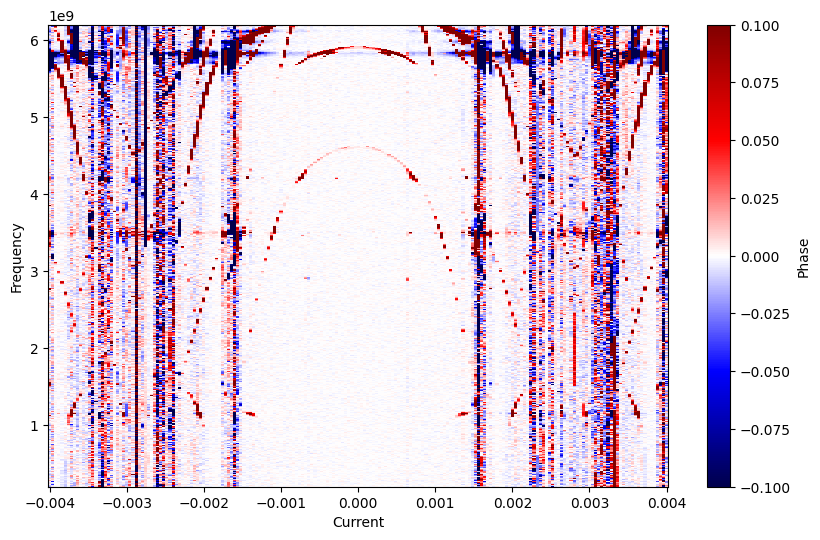

In [196]:
fig, ax = plt.subplots(figsize=(10,6))
im = ax.pcolormesh(coil_currents, np.linspace(.2*1e9, 6.2*1e9, 1201), better_data.transpose(), cmap='seismic'
                   , vmin=-0.1, vmax=0.1
                  )
ax.set_xlabel('Current')
ax.set_ylabel('Frequency')
fig.colorbar(im, label = "Phase")
# ax.set_ylim([7.2*1e9, 10.0*1e9])

(5000000000.0, 10000000000.0)

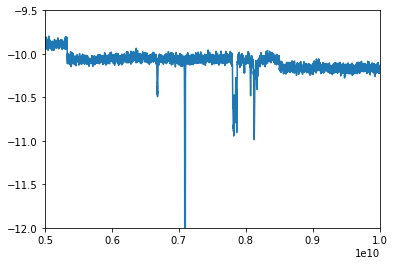

In [76]:
plt.plot(np.linspace(2.0*1e9, 10.0*1e9, 10001), plotting_data_two_tone_sweep[80])
plt.ylim([-12, -9.5])
plt.xlim([5e9, 10e9])

# Dual Flux Sweeps

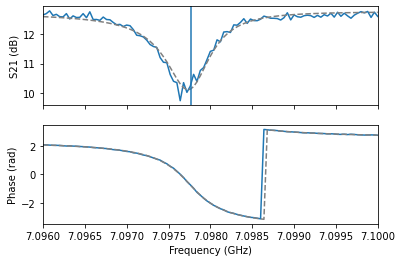

In [606]:
vna.two_tone_mode(two_tone_port=3, mode=False, frequency = 7298958000.0)



vna.start(start)
vna.stop(stop)
vna.port1.source_power(-50)
vna.points(101)
vna.averages(1)
vna.if_bandwidth(10)


fig, data = vna_trace(vna, run=True)

params, cov, chi = resonator_regression(data.index.to_numpy(), data['I'] + 1j*data['Q'])

    
rparams = reflection_resonator_params(*params, covar=cov)
smith = resonator_f_to_S(data.index.to_numpy(), *params)
fig.axes[0].plot(data.index/1e9, 20*np.log10(np.abs(smith)), '--', color='gray')
fig.axes[1].plot(data.index/1e9, np.angle(smith), '--', color='gray')

fig.axes[0].axvline(rparams['f0']/1e9)

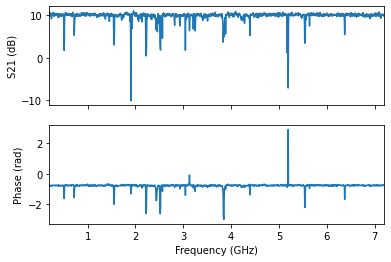

In [607]:
two_tone_start = 0.2*1e9
two_tone_end = 7.2*1e9
two_tone_power = 0
two_tone_points = 1401

vna.two_tone_mode(two_tone_port=3, mode=True, frequency = rparams['f0'])
vna.if_bandwidth(15)
vna.points(two_tone_points)
vna.start(two_tone_start)
vna.stop(two_tone_end)
vna.ports[2].source_power(two_tone_power)

fig, data = vna_trace(vna, run=True)


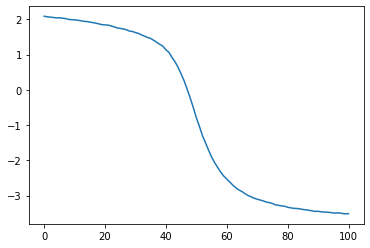

In [520]:
plt.plot(np.unwrap(data['phase']))

In [608]:
num_currents=201

In [609]:
coil_currents =  np.linspace(0, 44, num_currents) * 1e-6

In [610]:
coil_currents

array([0.000e+00, 2.200e-07, 4.400e-07, 6.600e-07, 8.800e-07, 1.100e-06,
       1.320e-06, 1.540e-06, 1.760e-06, 1.980e-06, 2.200e-06, 2.420e-06,
       2.640e-06, 2.860e-06, 3.080e-06, 3.300e-06, 3.520e-06, 3.740e-06,
       3.960e-06, 4.180e-06, 4.400e-06, 4.620e-06, 4.840e-06, 5.060e-06,
       5.280e-06, 5.500e-06, 5.720e-06, 5.940e-06, 6.160e-06, 6.380e-06,
       6.600e-06, 6.820e-06, 7.040e-06, 7.260e-06, 7.480e-06, 7.700e-06,
       7.920e-06, 8.140e-06, 8.360e-06, 8.580e-06, 8.800e-06, 9.020e-06,
       9.240e-06, 9.460e-06, 9.680e-06, 9.900e-06, 1.012e-05, 1.034e-05,
       1.056e-05, 1.078e-05, 1.100e-05, 1.122e-05, 1.144e-05, 1.166e-05,
       1.188e-05, 1.210e-05, 1.232e-05, 1.254e-05, 1.276e-05, 1.298e-05,
       1.320e-05, 1.342e-05, 1.364e-05, 1.386e-05, 1.408e-05, 1.430e-05,
       1.452e-05, 1.474e-05, 1.496e-05, 1.518e-05, 1.540e-05, 1.562e-05,
       1.584e-05, 1.606e-05, 1.628e-05, 1.650e-05, 1.672e-05, 1.694e-05,
       1.716e-05, 1.738e-05, 1.760e-05, 1.782e-05, 

In [611]:
dc_currents = np.linspace(2, 602, num_currents) * 1e-6

In [612]:
dc_currents

array([2.00e-06, 5.00e-06, 8.00e-06, 1.10e-05, 1.40e-05, 1.70e-05,
       2.00e-05, 2.30e-05, 2.60e-05, 2.90e-05, 3.20e-05, 3.50e-05,
       3.80e-05, 4.10e-05, 4.40e-05, 4.70e-05, 5.00e-05, 5.30e-05,
       5.60e-05, 5.90e-05, 6.20e-05, 6.50e-05, 6.80e-05, 7.10e-05,
       7.40e-05, 7.70e-05, 8.00e-05, 8.30e-05, 8.60e-05, 8.90e-05,
       9.20e-05, 9.50e-05, 9.80e-05, 1.01e-04, 1.04e-04, 1.07e-04,
       1.10e-04, 1.13e-04, 1.16e-04, 1.19e-04, 1.22e-04, 1.25e-04,
       1.28e-04, 1.31e-04, 1.34e-04, 1.37e-04, 1.40e-04, 1.43e-04,
       1.46e-04, 1.49e-04, 1.52e-04, 1.55e-04, 1.58e-04, 1.61e-04,
       1.64e-04, 1.67e-04, 1.70e-04, 1.73e-04, 1.76e-04, 1.79e-04,
       1.82e-04, 1.85e-04, 1.88e-04, 1.91e-04, 1.94e-04, 1.97e-04,
       2.00e-04, 2.03e-04, 2.06e-04, 2.09e-04, 2.12e-04, 2.15e-04,
       2.18e-04, 2.21e-04, 2.24e-04, 2.27e-04, 2.30e-04, 2.33e-04,
       2.36e-04, 2.39e-04, 2.42e-04, 2.45e-04, 2.48e-04, 2.51e-04,
       2.54e-04, 2.57e-04, 2.60e-04, 2.63e-04, 2.66e-04, 2.69e

In [564]:
yoko.ramp_current(coil_currents[0], step=coil_step*10, delay=0.3)
yoko2.ramp_current(dc_currents[0], step=dc_step*10, delay=0.3)

In [613]:
coil_step = 1e-6
dc_step = 10e-6

In [614]:
two_tone_power = 0

0it [00:00, ?it/s]

Current is: coil:0.0, dc:2e-06
Resonator frequency is: 7.0978673 GHz


1it [01:51, 111.12s/it]

Current is: coil:2.1999999999999998e-07, dc:4.9999999999999996e-06
Resonator frequency is: 7.0978443 GHz


2it [03:26, 102.07s/it]

Current is: coil:4.3999999999999997e-07, dc:8e-06
Resonator frequency is: 7.097725 GHz


3it [05:02, 99.15s/it] 

Current is: coil:6.6e-07, dc:1.1e-05
Resonator frequency is: 7.097807 GHz


4it [06:38, 97.76s/it]

Current is: coil:8.799999999999999e-07, dc:1.4e-05
Resonator frequency is: 7.0978055 GHz


5it [08:13, 96.99s/it]

Current is: coil:1.1e-06, dc:1.7e-05
Resonator frequency is: 7.0977872 GHz


6it [09:49, 96.53s/it]

Current is: coil:1.32e-06, dc:1.9999999999999998e-05
Resonator frequency is: 7.0977069 GHz


7it [11:25, 96.27s/it]

Current is: coil:1.5399999999999999e-06, dc:2.3e-05
Resonator frequency is: 7.0976178 GHz


8it [13:00, 96.06s/it]

Current is: coil:1.7599999999999999e-06, dc:2.6e-05
Resonator frequency is: 7.0974581 GHz


9it [14:36, 95.94s/it]

Current is: coil:1.98e-06, dc:2.9e-05
Resonator frequency is: 7.097346 GHz


10it [16:12, 95.83s/it]

Current is: coil:2.2e-06, dc:3.2e-05
Resonator frequency is: 7.09684 GHz


11it [17:47, 95.77s/it]

Current is: coil:2.4199999999999997e-06, dc:3.5e-05
Resonator frequency is: 7.09578 GHz


12it [19:23, 95.74s/it]

Current is: coil:2.64e-06, dc:3.7999999999999995e-05
Resonator frequency is: 7.10035 GHz


13it [20:59, 95.72s/it]

Current is: coil:2.8599999999999997e-06, dc:4.1e-05
Resonator frequency is: 7.099012 GHz


14it [22:34, 95.69s/it]

Current is: coil:3.0799999999999997e-06, dc:4.4e-05
Resonator frequency is: 7.098826 GHz


15it [24:10, 95.69s/it]

Current is: coil:3.2999999999999997e-06, dc:4.7e-05
Resonator frequency is: 7.098666 GHz


16it [25:45, 95.67s/it]

Current is: coil:3.5199999999999998e-06, dc:4.9999999999999996e-05
Resonator frequency is: 7.098517 GHz


17it [27:21, 95.65s/it]

Current is: coil:3.74e-06, dc:5.3e-05
Resonator frequency is: 7.098449 GHz


18it [28:57, 95.64s/it]

Current is: coil:3.96e-06, dc:5.6e-05
Resonator frequency is: 7.098354 GHz


19it [30:32, 95.68s/it]

Current is: coil:4.18e-06, dc:5.9e-05
Resonator frequency is: 7.098286 GHz


20it [32:08, 95.66s/it]

Current is: coil:4.4e-06, dc:6.2e-05


C:\Users\qnl\AppData\Local\Continuum\anaconda3\envs\parametric\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


Resonator frequency is: 7.097518 GHz


21it [33:44, 95.67s/it]

Current is: coil:4.62e-06, dc:6.5e-05
Resonator frequency is: 7.097743 GHz


22it [35:19, 95.64s/it]

Current is: coil:4.839999999999999e-06, dc:6.8e-05
Resonator frequency is: 7.097846 GHz


23it [36:55, 95.66s/it]

Current is: coil:5.059999999999999e-06, dc:7.099999999999999e-05
Resonator frequency is: 7.097871 GHz


24it [38:31, 95.65s/it]

Current is: coil:5.28e-06, dc:7.4e-05
Resonator frequency is: 7.097855 GHz


25it [40:06, 95.66s/it]

Current is: coil:5.5e-06, dc:7.7e-05
Resonator frequency is: 7.097767 GHz


26it [41:42, 95.67s/it]

Current is: coil:5.7199999999999994e-06, dc:7.999999999999999e-05
Resonator frequency is: 7.097762 GHz


27it [43:18, 95.69s/it]

Current is: coil:5.94e-06, dc:8.3e-05
Resonator frequency is: 7.098059 GHz


28it [44:54, 95.76s/it]

Current is: coil:6.1599999999999995e-06, dc:8.599999999999999e-05
Resonator frequency is: 7.098014 GHz


29it [46:29, 95.72s/it]

Current is: coil:6.38e-06, dc:8.9e-05
Resonator frequency is: 7.09804 GHz


30it [48:05, 95.69s/it]

Current is: coil:6.5999999999999995e-06, dc:9.2e-05
Resonator frequency is: 7.097192 GHz


31it [49:41, 95.66s/it]

Current is: coil:6.82e-06, dc:9.499999999999999e-05
Resonator frequency is: 7.097794 GHz


32it [51:16, 95.66s/it]

Current is: coil:7.0399999999999995e-06, dc:9.8e-05
Resonator frequency is: 7.097746 GHz


33it [52:52, 95.63s/it]

Current is: coil:7.259999999999999e-06, dc:0.000101
Resonator frequency is: 7.097517 GHz


34it [54:27, 95.65s/it]

Current is: coil:7.48e-06, dc:0.000104
Resonator frequency is: 7.09794 GHz


35it [56:03, 95.67s/it]

Current is: coil:7.699999999999999e-06, dc:0.000107
Resonator frequency is: 7.098 GHz


36it [57:39, 95.66s/it]

Current is: coil:7.92e-06, dc:0.00010999999999999999
Resonator frequency is: 7.097575 GHz


37it [59:15, 95.74s/it]

Current is: coil:8.14e-06, dc:0.000113
Resonator frequency is: 7.09795 GHz


38it [1:00:50, 95.72s/it]

Current is: coil:8.36e-06, dc:0.000116
Resonator frequency is: 7.097925 GHz


39it [1:02:26, 95.68s/it]

Current is: coil:8.58e-06, dc:0.00011899999999999999
Resonator frequency is: 7.097919 GHz


40it [1:04:02, 95.67s/it]

Current is: coil:8.8e-06, dc:0.000122
Resonator frequency is: 7.097947 GHz


41it [1:05:37, 95.69s/it]

Current is: coil:9.019999999999998e-06, dc:0.000125
Resonator frequency is: 7.097929 GHz


42it [1:07:13, 95.67s/it]

Current is: coil:9.24e-06, dc:0.000128
Resonator frequency is: 7.097933 GHz


43it [1:08:49, 95.64s/it]

Current is: coil:9.460000000000001e-06, dc:0.00013099999999999999
Resonator frequency is: 7.0979 GHz


44it [1:10:24, 95.60s/it]

Current is: coil:9.679999999999999e-06, dc:0.000134
Resonator frequency is: 7.0978902 GHz


45it [1:12:00, 95.60s/it]

Current is: coil:9.9e-06, dc:0.000137
Resonator frequency is: 7.0978731 GHz


46it [1:13:36, 95.67s/it]

Current is: coil:1.0119999999999998e-05, dc:0.00014
Resonator frequency is: 7.097857 GHz


47it [1:15:11, 95.67s/it]

Current is: coil:1.034e-05, dc:0.000143
Resonator frequency is: 7.0978356 GHz


48it [1:16:47, 95.68s/it]

Current is: coil:1.056e-05, dc:0.000146
Resonator frequency is: 7.0977911 GHz


49it [1:18:23, 95.66s/it]

Current is: coil:1.0779999999999998e-05, dc:0.000149
Resonator frequency is: 7.097774 GHz


50it [1:19:58, 95.66s/it]

Current is: coil:1.1e-05, dc:0.00015199999999999998
Resonator frequency is: 7.097734 GHz


51it [1:21:34, 95.64s/it]

Current is: coil:1.122e-05, dc:0.000155
Resonator frequency is: 7.097742 GHz


52it [1:23:09, 95.65s/it]

Current is: coil:1.1439999999999999e-05, dc:0.000158
Resonator frequency is: 7.097713 GHz


53it [1:24:45, 95.65s/it]

Current is: coil:1.166e-05, dc:0.00016099999999999998
Resonator frequency is: 7.097768 GHz


54it [1:26:21, 95.63s/it]

Current is: coil:1.188e-05, dc:0.000164
Resonator frequency is: 7.0977865 GHz


55it [1:27:56, 95.62s/it]

Current is: coil:1.21e-05, dc:0.000167
Resonator frequency is: 7.0978199 GHz


56it [1:29:32, 95.61s/it]

Current is: coil:1.2319999999999999e-05, dc:0.00016999999999999999
Resonator frequency is: 7.0978501 GHz


57it [1:31:07, 95.59s/it]

Current is: coil:1.254e-05, dc:0.000173
Resonator frequency is: 7.0978631 GHz


58it [1:32:43, 95.59s/it]

Current is: coil:1.276e-05, dc:0.000176
Resonator frequency is: 7.0978737 GHz


59it [1:34:19, 95.60s/it]

Current is: coil:1.298e-05, dc:0.000179
Resonator frequency is: 7.097843 GHz


60it [1:35:54, 95.64s/it]

Current is: coil:1.3199999999999999e-05, dc:0.00018199999999999998
Resonator frequency is: 7.0978704 GHz


61it [1:37:30, 95.62s/it]

Current is: coil:1.3419999999999999e-05, dc:0.000185
Resonator frequency is: 7.0978592 GHz


62it [1:39:05, 95.61s/it]

Current is: coil:1.364e-05, dc:0.000188
Resonator frequency is: 7.0978712 GHz


63it [1:40:41, 95.62s/it]

Current is: coil:1.386e-05, dc:0.00019099999999999998
Resonator frequency is: 7.0978861 GHz


64it [1:42:17, 95.66s/it]

Current is: coil:1.4079999999999999e-05, dc:0.000194
Resonator frequency is: 7.097831 GHz


65it [1:43:52, 95.65s/it]

Current is: coil:1.43e-05, dc:0.000197
Resonator frequency is: 7.097879 GHz


66it [1:45:28, 95.64s/it]

Current is: coil:1.4519999999999998e-05, dc:0.00019999999999999998
Resonator frequency is: 7.097873 GHz


67it [1:47:04, 95.68s/it]

Current is: coil:1.474e-05, dc:0.000203
Resonator frequency is: 7.098004 GHz


68it [1:48:40, 95.67s/it]

Current is: coil:1.496e-05, dc:0.000206
Resonator frequency is: 7.097555 GHz


69it [1:50:15, 95.65s/it]

Current is: coil:1.5179999999999999e-05, dc:0.00020899999999999998
Resonator frequency is: 7.097635 GHz


70it [1:51:51, 95.64s/it]

Current is: coil:1.5399999999999998e-05, dc:0.000212
Resonator frequency is: 7.097735 GHz


71it [1:53:26, 95.64s/it]

Current is: coil:1.562e-05, dc:0.000215
Resonator frequency is: 7.09748 GHz


72it [1:55:02, 95.62s/it]

Current is: coil:1.584e-05, dc:0.00021799999999999999
Resonator frequency is: 7.097518 GHz


73it [1:56:38, 95.61s/it]

Current is: coil:1.606e-05, dc:0.00022099999999999998
Resonator frequency is: 7.097741 GHz


74it [1:58:13, 95.62s/it]

Current is: coil:1.628e-05, dc:0.000224
Resonator frequency is: 7.09789 GHz


75it [1:59:49, 95.63s/it]

Current is: coil:1.6499999999999998e-05, dc:0.000227
Resonator frequency is: 7.097938 GHz


76it [2:01:25, 95.68s/it]

Current is: coil:1.672e-05, dc:0.00022999999999999998
Resonator frequency is: 7.0979313 GHz


77it [2:03:00, 95.67s/it]

Current is: coil:1.694e-05, dc:0.000233
Resonator frequency is: 7.0979329 GHz


78it [2:04:36, 95.65s/it]

Current is: coil:1.716e-05, dc:0.000236
Resonator frequency is: 7.097927 GHz


79it [2:06:12, 95.66s/it]

Current is: coil:1.738e-05, dc:0.00023899999999999998
Resonator frequency is: 7.097982 GHz


80it [2:07:47, 95.64s/it]

Current is: coil:1.76e-05, dc:0.000242
Resonator frequency is: 7.09798 GHz


81it [2:09:23, 95.65s/it]

Current is: coil:1.782e-05, dc:0.000245
Resonator frequency is: 7.098024 GHz


82it [2:10:59, 95.67s/it]

Current is: coil:1.8039999999999997e-05, dc:0.000248
Resonator frequency is: 7.098071 GHz


83it [2:12:34, 95.65s/it]

Current is: coil:1.826e-05, dc:0.000251
Resonator frequency is: 7.098116 GHz


84it [2:14:10, 95.65s/it]

Current is: coil:1.848e-05, dc:0.000254
Resonator frequency is: 7.098153 GHz


85it [2:15:46, 95.75s/it]

Current is: coil:1.8699999999999997e-05, dc:0.000257
Resonator frequency is: 7.098208 GHz


86it [2:17:21, 95.71s/it]

Current is: coil:1.8920000000000002e-05, dc:0.00026
Resonator frequency is: 7.098192 GHz


87it [2:18:57, 95.70s/it]

Current is: coil:1.914e-05, dc:0.000263
Resonator frequency is: 7.098251 GHz


88it [2:20:33, 95.68s/it]

Current is: coil:1.9359999999999998e-05, dc:0.000266
Resonator frequency is: 7.098201 GHz


89it [2:22:08, 95.66s/it]

Current is: coil:1.9580000000000002e-05, dc:0.000269
Resonator frequency is: 7.098229 GHz


90it [2:23:44, 95.69s/it]

Current is: coil:1.98e-05, dc:0.000272
Resonator frequency is: 7.098206 GHz


91it [2:25:20, 95.67s/it]

Current is: coil:2.0019999999999998e-05, dc:0.00027499999999999996
Resonator frequency is: 7.098045 GHz


92it [2:26:55, 95.65s/it]

Current is: coil:2.0239999999999996e-05, dc:0.000278
Resonator frequency is: 7.097584 GHz


93it [2:28:31, 95.66s/it]

Current is: coil:2.046e-05, dc:0.000281
Resonator frequency is: 7.09862 GHz


94it [2:30:07, 95.71s/it]

Current is: coil:2.068e-05, dc:0.00028399999999999996
Resonator frequency is: 7.098385 GHz


95it [2:31:42, 95.66s/it]

Current is: coil:2.0899999999999996e-05, dc:0.000287
Resonator frequency is: 7.098583 GHz


96it [2:33:18, 95.68s/it]

Current is: coil:2.112e-05, dc:0.00029
Resonator frequency is: 7.0968 GHz


97it [2:34:54, 95.69s/it]

Current is: coil:2.134e-05, dc:0.00029299999999999997
Resonator frequency is: 7.097428 GHz


98it [2:36:29, 95.66s/it]

Current is: coil:2.1559999999999997e-05, dc:0.000296
Resonator frequency is: 7.0976675 GHz


99it [2:38:05, 95.65s/it]

Current is: coil:2.178e-05, dc:0.000299
Resonator frequency is: 7.0977535 GHz


100it [2:39:41, 95.65s/it]

Current is: coil:2.2e-05, dc:0.00030199999999999997
Resonator frequency is: 7.0977621 GHz


101it [2:41:16, 95.64s/it]

Current is: coil:2.2219999999999997e-05, dc:0.000305
Resonator frequency is: 7.0977579 GHz


102it [2:42:52, 95.67s/it]

Current is: coil:2.244e-05, dc:0.000308
Resonator frequency is: 7.0977484 GHz


103it [2:44:28, 95.68s/it]

Current is: coil:2.266e-05, dc:0.00031099999999999997
Resonator frequency is: 7.097687 GHz


104it [2:46:03, 95.66s/it]

Current is: coil:2.2879999999999998e-05, dc:0.000314
Resonator frequency is: 7.0977003 GHz


105it [2:47:39, 95.66s/it]

Current is: coil:2.31e-05, dc:0.000317
Resonator frequency is: 7.097676 GHz


106it [2:49:15, 95.62s/it]

Current is: coil:2.332e-05, dc:0.00031999999999999997
Resonator frequency is: 7.09765 GHz


107it [2:50:50, 95.61s/it]

Current is: coil:2.3539999999999998e-05, dc:0.000323
Resonator frequency is: 7.0976225 GHz


108it [2:52:26, 95.61s/it]

Current is: coil:2.376e-05, dc:0.000326
Resonator frequency is: 7.0975689 GHz


109it [2:54:01, 95.64s/it]

Current is: coil:2.398e-05, dc:0.000329
Resonator frequency is: 7.0974788 GHz


110it [2:55:37, 95.61s/it]

Current is: coil:2.42e-05, dc:0.000332
Resonator frequency is: 7.0974526 GHz


111it [2:57:13, 95.64s/it]

Current is: coil:2.442e-05, dc:0.000335
Resonator frequency is: 7.097339 GHz


112it [2:58:48, 95.63s/it]

Current is: coil:2.4639999999999998e-05, dc:0.000338
Resonator frequency is: 7.09722 GHz


113it [3:00:24, 95.63s/it]

Current is: coil:2.486e-05, dc:0.000341
Resonator frequency is: 7.09668 GHz


114it [3:02:00, 95.62s/it]

Current is: coil:2.508e-05, dc:0.00034399999999999996
Resonator frequency is: 7.095 GHz


115it [3:03:35, 95.60s/it]

Current is: coil:2.53e-05, dc:0.000347
Resonator frequency is: 7.097458 GHz


116it [3:05:11, 95.61s/it]

Current is: coil:2.552e-05, dc:0.00035
Resonator frequency is: 7.0973 GHz


117it [3:06:46, 95.62s/it]

Current is: coil:2.5739999999999998e-05, dc:0.00035299999999999996
Resonator frequency is: 7.09927 GHz


118it [3:08:22, 95.60s/it]

Current is: coil:2.596e-05, dc:0.000356
Resonator frequency is: 7.098484 GHz


119it [3:09:58, 95.64s/it]

Current is: coil:2.618e-05, dc:0.000359
Resonator frequency is: 7.098216 GHz


120it [3:11:33, 95.64s/it]

Current is: coil:2.6399999999999998e-05, dc:0.00036199999999999996
Resonator frequency is: 7.097901 GHz


121it [3:13:09, 95.66s/it]

Current is: coil:2.662e-05, dc:0.000365
Resonator frequency is: 7.097539 GHz


122it [3:14:45, 95.64s/it]

Current is: coil:2.6839999999999997e-05, dc:0.000368
Resonator frequency is: 7.09773 GHz


123it [3:16:21, 95.86s/it]

Current is: coil:2.706e-05, dc:0.00037099999999999996
Resonator frequency is: 7.09742 GHz


124it [3:17:57, 95.84s/it]

Current is: coil:2.728e-05, dc:0.000374
Resonator frequency is: 7.098834 GHz


125it [3:19:32, 95.79s/it]

Current is: coil:2.7499999999999998e-05, dc:0.000377
Resonator frequency is: 7.09822 GHz


126it [3:21:08, 95.76s/it]

Current is: coil:2.772e-05, dc:0.00037999999999999997
Resonator frequency is: 7.09778 GHz


127it [3:22:44, 95.76s/it]

Current is: coil:2.794e-05, dc:0.000383
Resonator frequency is: 7.09776 GHz


128it [3:24:19, 95.71s/it]

Current is: coil:2.8159999999999998e-05, dc:0.000386
Resonator frequency is: 7.097423 GHz


129it [3:25:55, 95.70s/it]

Current is: coil:2.838e-05, dc:0.00038899999999999997
Resonator frequency is: 7.097581 GHz


130it [3:27:31, 95.68s/it]

Current is: coil:2.86e-05, dc:0.000392
Resonator frequency is: 7.097208 GHz


131it [3:29:06, 95.67s/it]

Current is: coil:2.882e-05, dc:0.000395
Resonator frequency is: 7.097502 GHz


132it [3:30:42, 95.66s/it]

Current is: coil:2.9039999999999996e-05, dc:0.00039799999999999997
Resonator frequency is: 7.097535 GHz


133it [3:32:18, 95.64s/it]

Current is: coil:2.926e-05, dc:0.000401
Resonator frequency is: 7.097581 GHz


134it [3:33:53, 95.65s/it]

Current is: coil:2.948e-05, dc:0.000404
Resonator frequency is: 7.097386 GHz


135it [3:35:29, 95.62s/it]

Current is: coil:2.9699999999999997e-05, dc:0.00040699999999999997
Resonator frequency is: 7.097711 GHz


136it [3:37:05, 95.63s/it]

Current is: coil:2.992e-05, dc:0.00041
Resonator frequency is: 7.097768 GHz


137it [3:38:40, 95.61s/it]

Current is: coil:3.014e-05, dc:0.00041299999999999996
Resonator frequency is: 7.097817 GHz


138it [3:40:16, 95.57s/it]

Current is: coil:3.0359999999999997e-05, dc:0.000416
Resonator frequency is: 7.09781 GHz


139it [3:41:52, 95.72s/it]

Current is: coil:3.058e-05, dc:0.000419
Resonator frequency is: 7.097857 GHz


140it [3:43:27, 95.72s/it]

Current is: coil:3.0799999999999996e-05, dc:0.00042199999999999996
Resonator frequency is: 7.097816 GHz


141it [3:45:03, 95.71s/it]

Current is: coil:3.102e-05, dc:0.000425
Resonator frequency is: 7.097793 GHz


142it [3:46:39, 95.67s/it]

Current is: coil:3.124e-05, dc:0.000428
Resonator frequency is: 7.097689 GHz


143it [3:48:14, 95.66s/it]

Current is: coil:3.146e-05, dc:0.00043099999999999996
Resonator frequency is: 7.09788 GHz


144it [3:49:50, 95.65s/it]

Current is: coil:3.168e-05, dc:0.000434
Resonator frequency is: 7.0978929 GHz


145it [3:51:25, 95.63s/it]

Current is: coil:3.1899999999999996e-05, dc:0.000437
Resonator frequency is: 7.097902 GHz


146it [3:53:01, 95.62s/it]

Current is: coil:3.212e-05, dc:0.00043999999999999996
Resonator frequency is: 7.097835 GHz


147it [3:54:37, 95.63s/it]

Current is: coil:3.234e-05, dc:0.000443
Resonator frequency is: 7.097819 GHz


148it [3:56:13, 95.74s/it]

Current is: coil:3.256e-05, dc:0.000446
Resonator frequency is: 7.097841 GHz


149it [3:57:48, 95.69s/it]

Current is: coil:3.278e-05, dc:0.00044899999999999996
Resonator frequency is: 7.097841 GHz


150it [3:59:24, 95.68s/it]

Current is: coil:3.2999999999999996e-05, dc:0.000452
Resonator frequency is: 7.097896 GHz


151it [4:01:00, 95.69s/it]

Current is: coil:3.322e-05, dc:0.000455
Resonator frequency is: 7.0978852 GHz


152it [4:02:35, 95.63s/it]

Current is: coil:3.344e-05, dc:0.00045799999999999997
Resonator frequency is: 7.097905 GHz


153it [4:04:11, 95.65s/it]

Current is: coil:3.366e-05, dc:0.000461
Resonator frequency is: 7.097843 GHz


154it [4:05:46, 95.64s/it]

Current is: coil:3.388e-05, dc:0.000464
Resonator frequency is: 7.097891 GHz


155it [4:07:22, 95.64s/it]

Current is: coil:3.41e-05, dc:0.00046699999999999997
Resonator frequency is: 7.097911 GHz


156it [4:08:58, 95.62s/it]

Current is: coil:3.432e-05, dc:0.00047
Resonator frequency is: 7.097521 GHz


157it [4:10:34, 95.74s/it]

Current is: coil:3.454e-05, dc:0.000473
Resonator frequency is: 7.097997 GHz


158it [4:12:09, 95.72s/it]

Current is: coil:3.476e-05, dc:0.00047599999999999997
Resonator frequency is: 7.097897 GHz


159it [4:13:45, 95.69s/it]

Current is: coil:3.4979999999999994e-05, dc:0.000479
Resonator frequency is: 7.097708 GHz


160it [4:15:21, 95.68s/it]

Current is: coil:3.52e-05, dc:0.00048199999999999995
Resonator frequency is: 7.0976361 GHz


161it [4:16:56, 95.68s/it]

Current is: coil:3.542e-05, dc:0.00048499999999999997
Resonator frequency is: 7.0976549 GHz


162it [4:18:32, 95.64s/it]

Current is: coil:3.564e-05, dc:0.000488
Resonator frequency is: 7.097749 GHz


163it [4:20:08, 95.77s/it]

Current is: coil:3.586e-05, dc:0.000491
Resonator frequency is: 7.097864 GHz


164it [4:21:44, 95.72s/it]

Current is: coil:3.607999999999999e-05, dc:0.000494
Resonator frequency is: 7.097546 GHz


165it [4:23:19, 95.67s/it]

Current is: coil:3.6299999999999995e-05, dc:0.0004969999999999999
Resonator frequency is: 7.097953 GHz


166it [4:24:55, 95.68s/it]

Current is: coil:3.652e-05, dc:0.0005
Resonator frequency is: 7.09795 GHz


167it [4:26:30, 95.65s/it]

Current is: coil:3.674e-05, dc:0.000503
Resonator frequency is: 7.097927 GHz


168it [4:28:06, 95.65s/it]

Current is: coil:3.696e-05, dc:0.0005059999999999999
Resonator frequency is: 7.09821 GHz


169it [4:29:42, 95.64s/it]

Current is: coil:3.718e-05, dc:0.000509
Resonator frequency is: 7.09817 GHz


170it [4:31:17, 95.66s/it]

Current is: coil:3.7399999999999994e-05, dc:0.000512
Resonator frequency is: 7.098312 GHz


171it [4:32:53, 95.66s/it]

Current is: coil:3.7619999999999996e-05, dc:0.0005149999999999999
Resonator frequency is: 7.098363 GHz


172it [4:34:29, 95.68s/it]

Current is: coil:3.7840000000000004e-05, dc:0.000518
Resonator frequency is: 7.098564 GHz


173it [4:36:04, 95.66s/it]

Current is: coil:3.806e-05, dc:0.000521
Resonator frequency is: 7.09753 GHz


174it [4:37:40, 95.70s/it]

Current is: coil:3.828e-05, dc:0.0005239999999999999
Resonator frequency is: 7.098 GHz


175it [4:39:17, 95.94s/it]

Current is: coil:3.85e-05, dc:0.000527
Resonator frequency is: 7.097494 GHz


176it [4:40:52, 95.85s/it]

Current is: coil:3.8719999999999995e-05, dc:0.00053
Resonator frequency is: 7.0977813 GHz


177it [4:42:28, 95.79s/it]

Current is: coil:3.8939999999999996e-05, dc:0.0005329999999999999
Resonator frequency is: 7.097851 GHz


178it [4:44:04, 95.76s/it]

Current is: coil:3.9160000000000005e-05, dc:0.000536
Resonator frequency is: 7.097905 GHz


179it [4:45:39, 95.70s/it]

Current is: coil:3.938e-05, dc:0.000539
Resonator frequency is: 7.098453 GHz


180it [4:47:15, 95.67s/it]

Current is: coil:3.96e-05, dc:0.000542
Resonator frequency is: 7.09764 GHz


181it [4:48:51, 95.79s/it]

Current is: coil:3.982e-05, dc:0.000545
Resonator frequency is: 7.097633 GHz


182it [4:50:27, 95.73s/it]

Current is: coil:4.0039999999999996e-05, dc:0.000548
Resonator frequency is: 7.097579 GHz


183it [4:52:02, 95.73s/it]

Current is: coil:4.026e-05, dc:0.000551
Resonator frequency is: 7.09717 GHz


184it [4:53:38, 95.70s/it]

Current is: coil:4.047999999999999e-05, dc:0.000554
Resonator frequency is: 7.0973689 GHz


185it [4:55:14, 95.69s/it]

Current is: coil:4.07e-05, dc:0.000557
Resonator frequency is: 7.0974593 GHz


186it [4:56:49, 95.72s/it]

Current is: coil:4.092e-05, dc:0.00056
Resonator frequency is: 7.0975293 GHz


187it [4:58:25, 95.70s/it]

Current is: coil:4.1139999999999996e-05, dc:0.000563
Resonator frequency is: 7.0975821 GHz


188it [5:00:01, 95.67s/it]

Current is: coil:4.136e-05, dc:0.000566
Resonator frequency is: 7.0976361 GHz


189it [5:01:36, 95.66s/it]

Current is: coil:4.158e-05, dc:0.000569
Resonator frequency is: 7.0976784 GHz


190it [5:03:12, 95.74s/it]

Current is: coil:4.179999999999999e-05, dc:0.000572
Resonator frequency is: 7.0977155 GHz


191it [5:04:48, 95.73s/it]

Current is: coil:4.202e-05, dc:0.000575
Resonator frequency is: 7.0977496 GHz


192it [5:06:23, 95.69s/it]

Current is: coil:4.224e-05, dc:0.000578
Resonator frequency is: 7.0977615 GHz


193it [5:07:59, 95.67s/it]

Current is: coil:4.246e-05, dc:0.000581
Resonator frequency is: 7.0977852 GHz


194it [5:09:35, 95.67s/it]

Current is: coil:4.268e-05, dc:0.000584
Resonator frequency is: 7.0977996 GHz


195it [5:11:10, 95.68s/it]

Current is: coil:4.29e-05, dc:0.000587
Resonator frequency is: 7.0978391 GHz


196it [5:12:46, 95.69s/it]

Current is: coil:4.3119999999999994e-05, dc:0.0005899999999999999
Resonator frequency is: 7.0978636 GHz


197it [5:14:22, 95.67s/it]

Current is: coil:4.334e-05, dc:0.000593
Resonator frequency is: 7.097872 GHz


198it [5:15:57, 95.64s/it]

Current is: coil:4.356e-05, dc:0.000596
Resonator frequency is: 7.0978745 GHz


199it [5:17:33, 95.68s/it]

Current is: coil:4.378e-05, dc:0.0005989999999999999
Resonator frequency is: 7.0978712 GHz


200it [5:19:09, 95.67s/it]

Current is: coil:4.4e-05, dc:0.000602
Resonator frequency is: 7.0978749 GHz


201it [5:20:44, 95.75s/it]


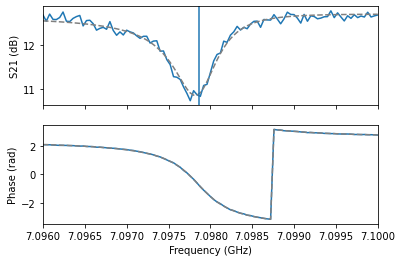

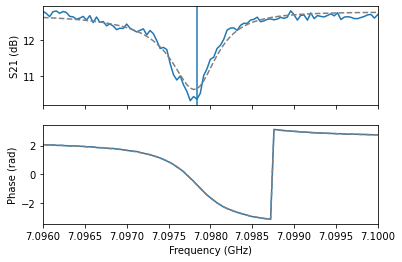

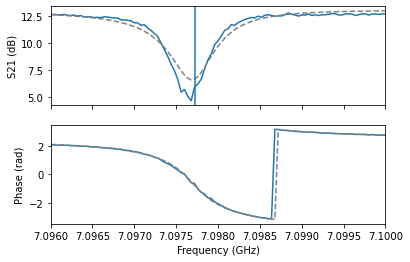

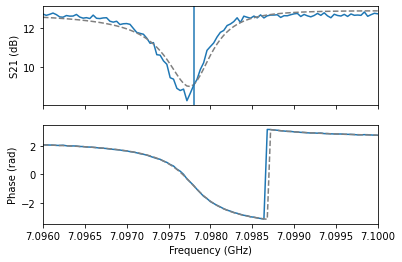

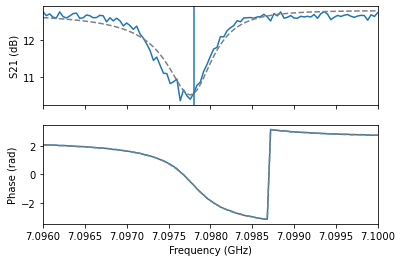

...

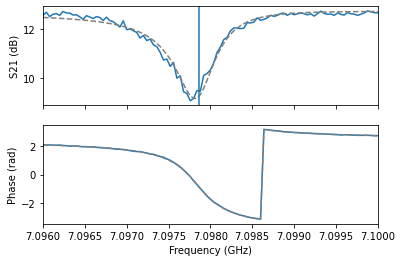

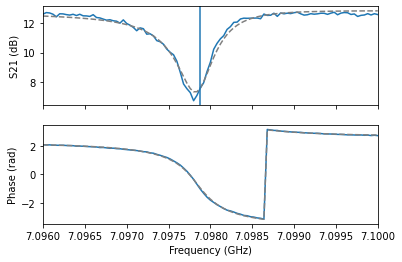

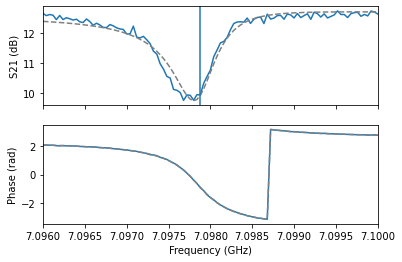

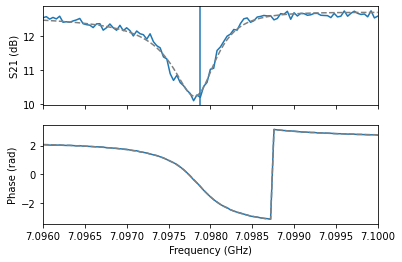

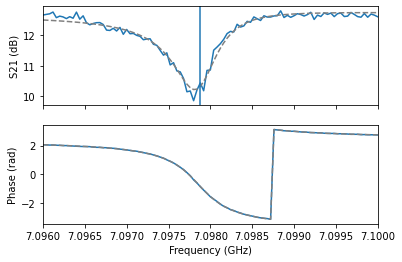

In [615]:
sweeps = []
res_freqs = []

for i, current_val in tqdm(enumerate(coil_currents)):
    print(f"Current is: coil:{current_val}, dc:{dc_currents[i]}" )
    # Set yoko
    yoko.on()
    yoko.ramp_current(current_val, step=coil_step, delay=0.3)
    # Set dc line yoko2
    yoko2.on()
    yoko2.ramp_current(dc_currents[i], step=dc_step, delay=0.3)
    time.sleep(3)
    
    ### Fit resonator
    vna.two_tone_mode(two_tone_port=3, mode=False, frequency = 7298958000.0)


    vna.start(start)
    vna.stop(stop)
    vna.port1.source_power(-50)
    vna.points(101)
    vna.averages(1)
    vna.if_bandwidth(10)


    fig, data = vna_trace(vna, run=True)

    params, cov, chi = resonator_regression(data.index.to_numpy(), data['I'] + 1j*data['Q'])


    # Reflection_fitting
    rparams = reflection_resonator_params(*params, covar=cov)
    smith = resonator_f_to_S(data.index.to_numpy(), *params)
    fig.axes[0].plot(data.index/1e9, 20*np.log10(np.abs(smith)), '--', color='gray')
    fig.axes[1].plot(data.index/1e9, np.angle(smith), '--', color='gray')

    fig.axes[0].axvline(rparams['f0']/1e9)
    res_freq = rparams['f0']/1e9
    print(f'Resonator frequency is: {res_freq} GHz')
    res_freqs.append(res_freq)
    
    
    
    ### Perform Two Tone       
    vna.two_tone_mode(two_tone_port=3, mode=True, frequency = rparams['f0'])
    vna.if_bandwidth(15)
    vna.points(two_tone_points)
    vna.start(two_tone_start)
    vna.stop(two_tone_end)
    vna.ports[2].source_power(two_tone_power)
    
    
    
    
    try:
        swp = vna_trace_no_fig(vna, run=True)
    except:
        try:
            print('Error')
            time.sleep(3)
            swp = vna_trace_no_fig(vna, run=False)
        except:
            print(f'Still error on {i}')

    sweeps += [swp]

name = f'2023-11-07_{device}_{qubit}-current_sweep_{two_tone_start}to{two_tone_end}GHz_{two_tone_power}dbm_c2p_line_1attenuators.csv'
data = pd.concat(sweeps, keys=coil_currents[:i+1], names=['Current'])
data.to_csv(datadir / name)
        

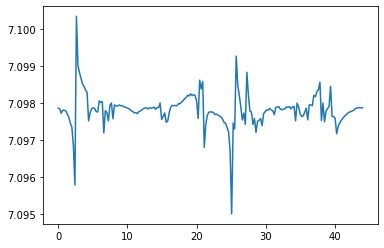

In [627]:
plt.plot(coil_currents*1e6, res_freqs)

In [652]:
res_freqs_data = pd.DataFrame(res_freqs)

In [654]:
res_freqs_data.to_csv(datadir / f'{device}_{qubit}_two_tone_res_freqs_2phi_regime.csv')

## Read CSV

In [169]:
name = '2023-11-07_cos2phi_v2_sep_style_light_c2p-current_sweep_200000000.0to7200000000.0GHz_20dbm.csv'

In [617]:
two_tone_sweep = pd.read_csv(datadir / name, index_col=[0, 1])


In [618]:
plotting_data_two_tone_sweep = two_tone_sweep['phase'].to_numpy().reshape((len(coil_currents), two_tone_points))

C:\Users\qnl\AppData\Local\Continuum\anaconda3\envs\parametric\lib\site-packages\ipykernel_launcher.py:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  This is separate from the ipykernel package so we can avoid doing imports until


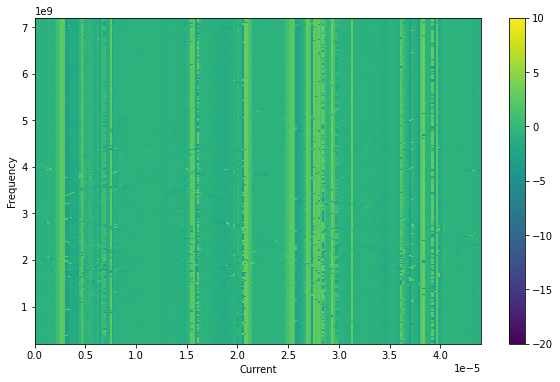

In [619]:
fig, ax = plt.subplots(figsize=(10,6))
im = ax.pcolormesh(coil_currents, np.linspace(two_tone_start, two_tone_end, two_tone_points),plotting_data_two_tone_sweep.transpose()
             , vmin=-20, vmax=10
             )
ax.set_xlabel('Current')
ax.set_ylabel('Frequency')

fig.colorbar(im)


### Better Visibility

In [628]:
plotting_data_two_tone_sweep = np.array(two_tone_sweep['phase']).reshape((len(coil_currents),two_tone_points))

In [629]:
better_data = []

for row in np.array(plotting_data_two_tone_sweep):
#     row = np.unwrap(row)
    new_row = (row-np.median(row))/ abs(np.median(row))
    better_data.append(new_row)
    
better_data = np.array(better_data)

C:\Users\qnl\AppData\Local\Continuum\anaconda3\envs\parametric\lib\site-packages\ipykernel_launcher.py:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  This is separate from the ipykernel package so we can avoid doing imports until


(0.0, 1000000000.0)

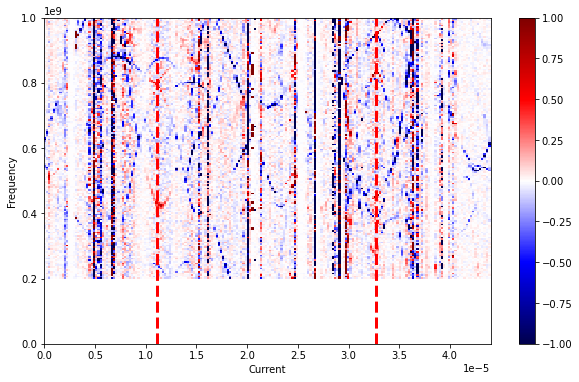

In [651]:
fig, ax = plt.subplots(figsize=(10,6))
im = ax.pcolormesh(coil_currents, np.linspace(.2*1e9, 7.2*1e9, two_tone_points), better_data.transpose(), cmap='seismic'
                   , vmin=-1, vmax=1
                  )
ax.set_xlabel('Current')
ax.set_ylabel('Frequency')
ax.axvline(11.1e-6, c='red', linestyle='--', linewidth=3)
ax.axvline(32.7e-6, c='red', linestyle='--', linewidth=3)
fig.colorbar(im)
ax.set_ylim([0,1e9])
# ax.set_ylim([7.2*1e9, 10.0*1e9])

In [650]:
dc_currents

array([2.00e-06, 5.00e-06, 8.00e-06, 1.10e-05, 1.40e-05, 1.70e-05,
       2.00e-05, 2.30e-05, 2.60e-05, 2.90e-05, 3.20e-05, 3.50e-05,
       3.80e-05, 4.10e-05, 4.40e-05, 4.70e-05, 5.00e-05, 5.30e-05,
       5.60e-05, 5.90e-05, 6.20e-05, 6.50e-05, 6.80e-05, 7.10e-05,
       7.40e-05, 7.70e-05, 8.00e-05, 8.30e-05, 8.60e-05, 8.90e-05,
       9.20e-05, 9.50e-05, 9.80e-05, 1.01e-04, 1.04e-04, 1.07e-04,
       1.10e-04, 1.13e-04, 1.16e-04, 1.19e-04, 1.22e-04, 1.25e-04,
       1.28e-04, 1.31e-04, 1.34e-04, 1.37e-04, 1.40e-04, 1.43e-04,
       1.46e-04, 1.49e-04, 1.52e-04, 1.55e-04, 1.58e-04, 1.61e-04,
       1.64e-04, 1.67e-04, 1.70e-04, 1.73e-04, 1.76e-04, 1.79e-04,
       1.82e-04, 1.85e-04, 1.88e-04, 1.91e-04, 1.94e-04, 1.97e-04,
       2.00e-04, 2.03e-04, 2.06e-04, 2.09e-04, 2.12e-04, 2.15e-04,
       2.18e-04, 2.21e-04, 2.24e-04, 2.27e-04, 2.30e-04, 2.33e-04,
       2.36e-04, 2.39e-04, 2.42e-04, 2.45e-04, 2.48e-04, 2.51e-04,
       2.54e-04, 2.57e-04, 2.60e-04, 2.63e-04, 2.66e-04, 2.69e